In [6]:
!pip install boto3
!pip install amazon-kinesis-client
!pip install pandas
import os

ERROR: Could not find a version that satisfies the requirement amazon-kinesis-client (from versions: none)
ERROR: No matching distribution found for amazon-kinesis-client


In [7]:
import boto3
import json
import pandas as pd
import time
import matplotlib.pyplot as plt

In [8]:
# Initialize the Kinesis client with the correct region
kinesis = boto3.client('kinesis', region_name='us-east-1')

# Define the stream name
stream_name = 'Stockdatastream'

In [9]:
# Function to get shard iterators
def get_shard_iterators(stream_name):
    response = kinesis.describe_stream(StreamName=stream_name)
    shard_ids = [shard['ShardId'] for shard in response['StreamDescription']['Shards']]
    shard_iterators = {}
    for shard_id in shard_ids:
        shard_iterators[shard_id] = kinesis.get_shard_iterator(
            StreamName=stream_name,
            ShardId=shard_id,
            ShardIteratorType='LATEST'  # Start from the latest data
        )['ShardIterator']
    return shard_iterators


In [10]:
# Function to read records from Kinesis
def read_records_from_kinesis(shard_iterator):
    records_response = kinesis.get_records(ShardIterator=shard_iterator, Limit=10)
    records = records_response['Records']
    next_shard_iterator = records_response['NextShardIterator']
    
    stock_data = []
    for record in records:
        stock_data.append(json.loads(record['Data']))
    
    return stock_data, next_shard_iterator


In [11]:
# Initialize shard iterators
shard_iterators = get_shard_iterators(stream_name)
print("Shard iterators initialized.")


Shard iterators initialized.


Listening for stock data...
New records received:
  symbol   price                  timestamp
0   AAPL  121.07 2024-12-11 20:17:56.548550
1   AAPL  142.07 2024-12-11 20:17:58.558068
2   AAPL  123.40 2024-12-11 20:18:00.567043
3   AAPL  146.66 2024-12-11 20:18:02.576719
4   AAPL  131.95 2024-12-11 20:18:04.588374
5   AAPL  135.15 2024-12-11 20:18:06.601361
6   AAPL  135.97 2024-12-11 20:18:08.613098
7   AAPL  142.74 2024-12-11 20:18:10.621550
8   AAPL  125.04 2024-12-11 20:18:12.630586
9   AAPL  142.55 2024-12-11 20:18:14.640277


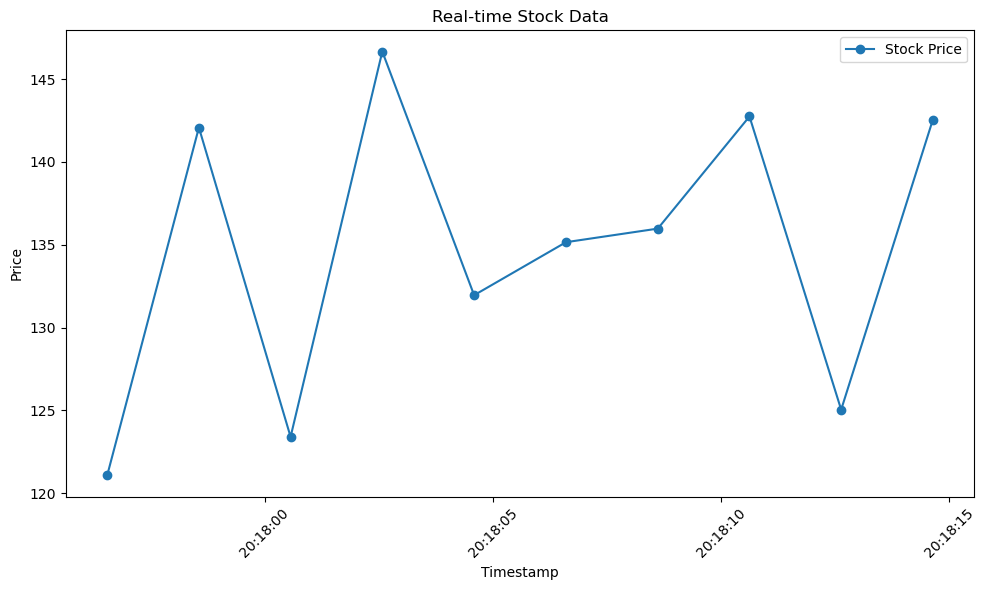

New records received:
  symbol   price                  timestamp
0   AAPL  141.57 2024-12-11 20:18:16.652474
1   AAPL  132.78 2024-12-11 20:18:18.662263
2   AAPL  131.47 2024-12-11 20:18:20.720769
3   AAPL  139.81 2024-12-11 20:18:22.783434
4   AAPL  125.10 2024-12-11 20:18:24.792029
5   AAPL  134.20 2024-12-11 20:18:26.800319
6   AAPL  132.80 2024-12-11 20:18:28.808935
7   AAPL  120.43 2024-12-11 20:18:30.820802
8   AAPL  132.22 2024-12-11 20:18:32.829717
9   AAPL  131.58 2024-12-11 20:18:34.840395


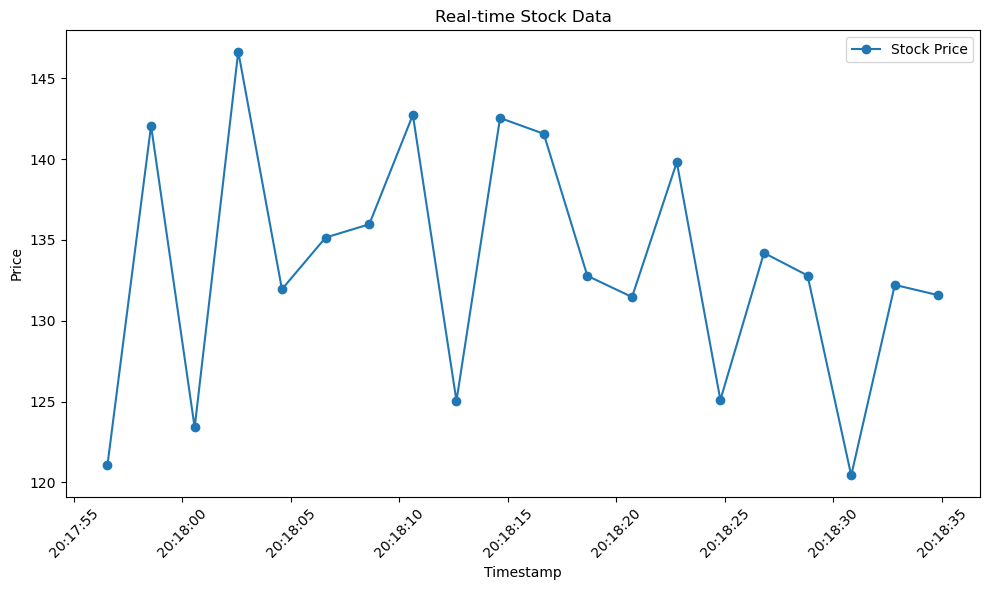

New records received:
  symbol   price                  timestamp
0   AAPL  128.84 2024-12-11 20:18:36.850363
1   AAPL  144.94 2024-12-11 20:18:38.860630
2   AAPL  138.81 2024-12-11 20:18:40.869560
3   AAPL  147.32 2024-12-11 20:18:42.877576
4   AAPL  127.89 2024-12-11 20:18:44.885510
5   AAPL  147.73 2024-12-11 20:18:46.895427
6   AAPL  132.39 2024-12-11 20:18:48.904278
7   AAPL  130.60 2024-12-11 20:18:50.913004
8   AAPL  122.02 2024-12-11 20:18:52.921571
9   AAPL  121.46 2024-12-11 20:18:54.979322


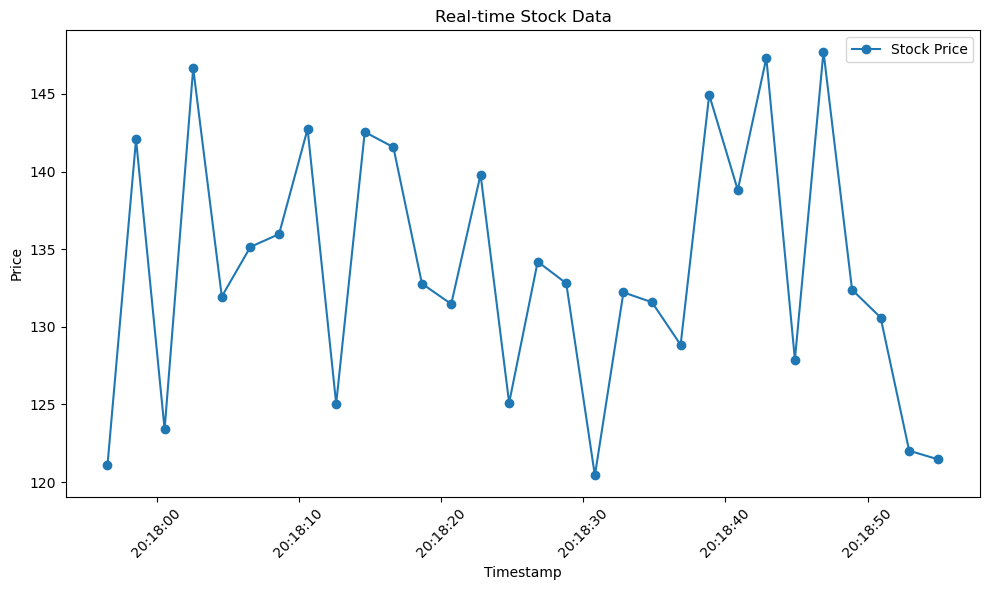

New records received:
  symbol   price                  timestamp
0   AAPL  145.95 2024-12-11 20:18:56.988326
1   AAPL  129.43 2024-12-11 20:18:59.013862
2   AAPL  141.57 2024-12-11 20:19:01.022241
3   AAPL  144.65 2024-12-11 20:19:03.032274
4   AAPL  133.92 2024-12-11 20:19:05.041437
5   AAPL  132.52 2024-12-11 20:19:07.052689
6   AAPL  143.63 2024-12-11 20:19:09.061372
7   AAPL  131.59 2024-12-11 20:19:11.074366
8   AAPL  123.87 2024-12-11 20:19:13.084199
9   AAPL  147.47 2024-12-11 20:19:15.092990


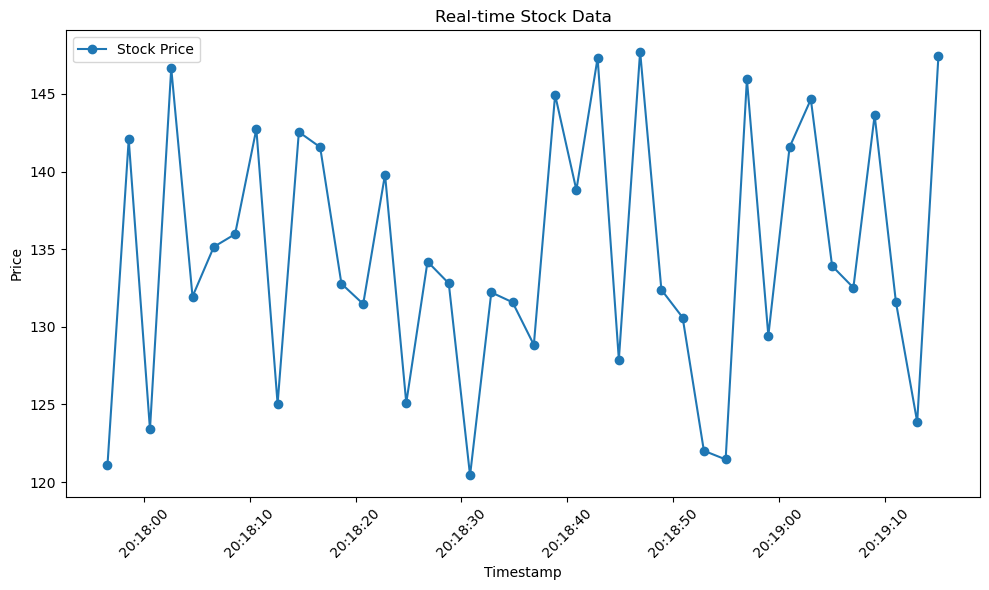

New records received:
  symbol   price                  timestamp
0   AAPL  136.47 2024-12-11 20:19:17.102264
1   AAPL  126.86 2024-12-11 20:19:19.112007
2   AAPL  145.29 2024-12-11 20:19:21.120488
3   AAPL  120.49 2024-12-11 20:19:23.129671
4   AAPL  139.90 2024-12-11 20:19:25.140006
5   AAPL  143.38 2024-12-11 20:19:27.148411
6   AAPL  149.91 2024-12-11 20:19:29.157058
7   AAPL  132.16 2024-12-11 20:19:31.166958
8   AAPL  146.24 2024-12-11 20:19:33.175092
9   AAPL  142.62 2024-12-11 20:19:35.183831


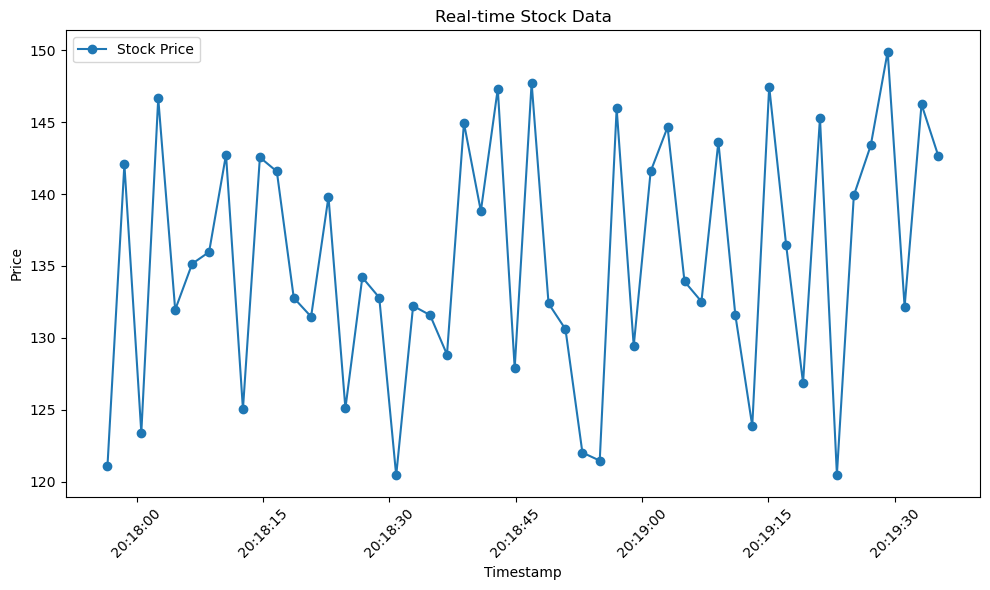

New records received:
  symbol   price                  timestamp
0   AAPL  138.45 2024-12-11 20:19:37.195182
1   AAPL  142.30 2024-12-11 20:19:39.203306
2   AAPL  138.75 2024-12-11 20:19:41.213842
3   AAPL  134.14 2024-12-11 20:19:43.223252
4   AAPL  137.30 2024-12-11 20:19:45.232091
5   AAPL  120.78 2024-12-11 20:19:47.240288
6   AAPL  139.65 2024-12-11 20:19:49.249427
7   AAPL  134.40 2024-12-11 20:19:51.259076
8   AAPL  126.79 2024-12-11 20:19:53.269170
9   AAPL  136.31 2024-12-11 20:19:55.279173


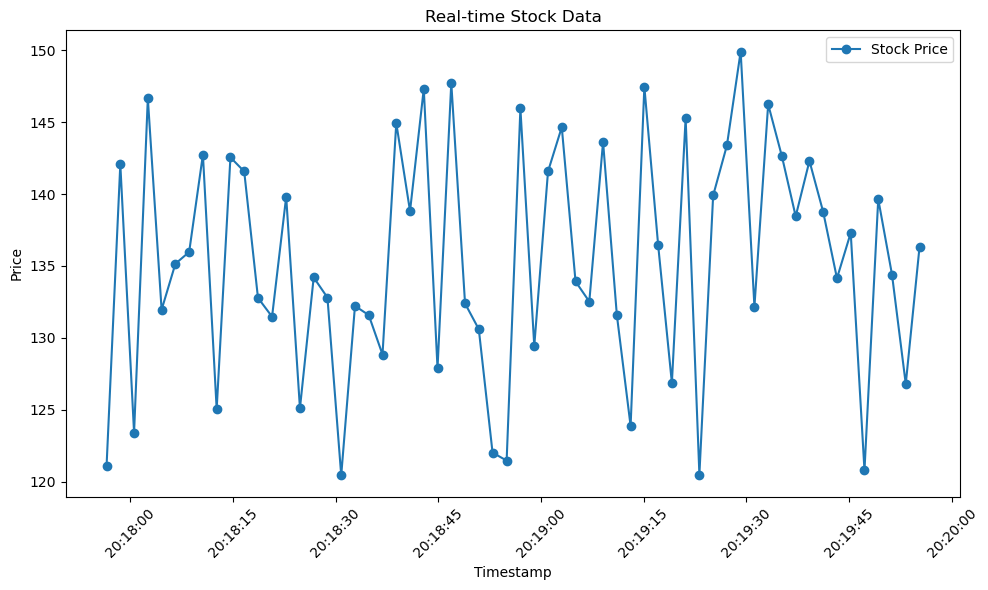

New records received:
  symbol   price                  timestamp
0   AAPL  128.99 2024-12-11 20:19:57.289844
1   AAPL  124.49 2024-12-11 20:19:59.298831
2   AAPL  149.56 2024-12-11 20:20:01.310585
3   AAPL  143.30 2024-12-11 20:20:03.327480


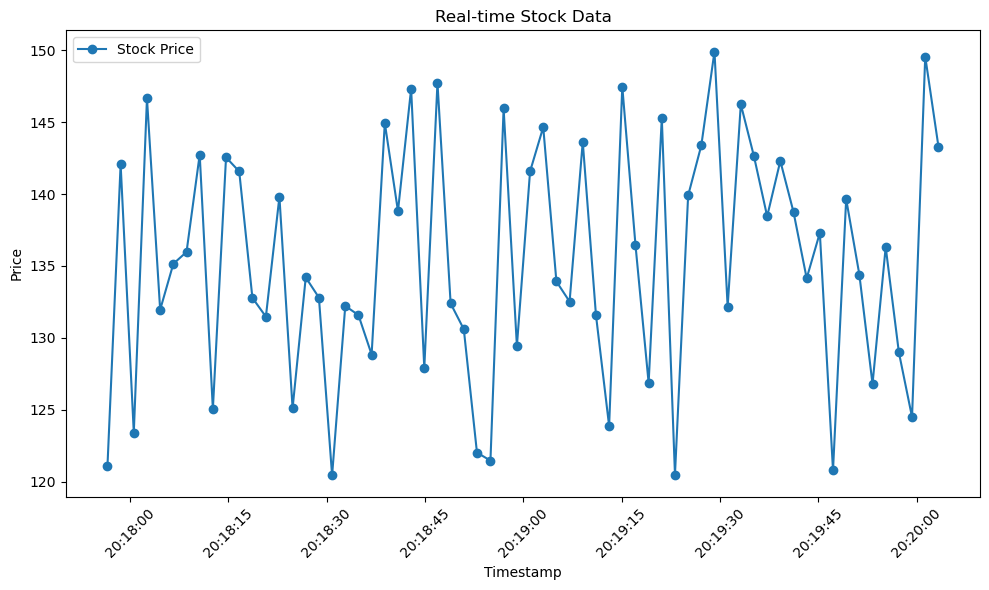

New records received:
  symbol   price                  timestamp
0   AAPL  124.58 2024-12-11 20:20:05.337072
1   AAPL  139.24 2024-12-11 20:20:07.347090


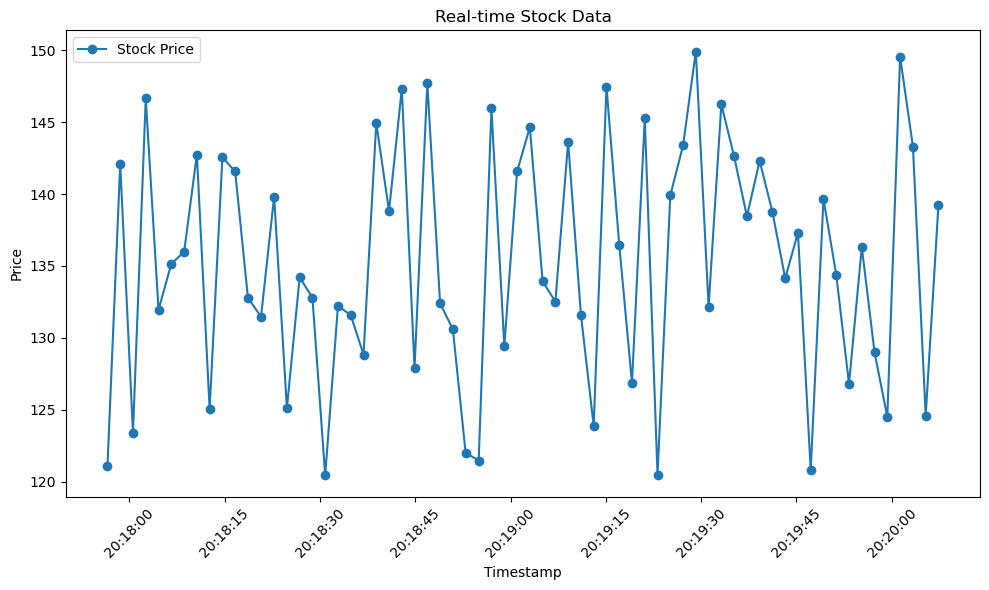

New records received:
  symbol  price                  timestamp
0   AAPL  137.5 2024-12-11 20:20:55.568087


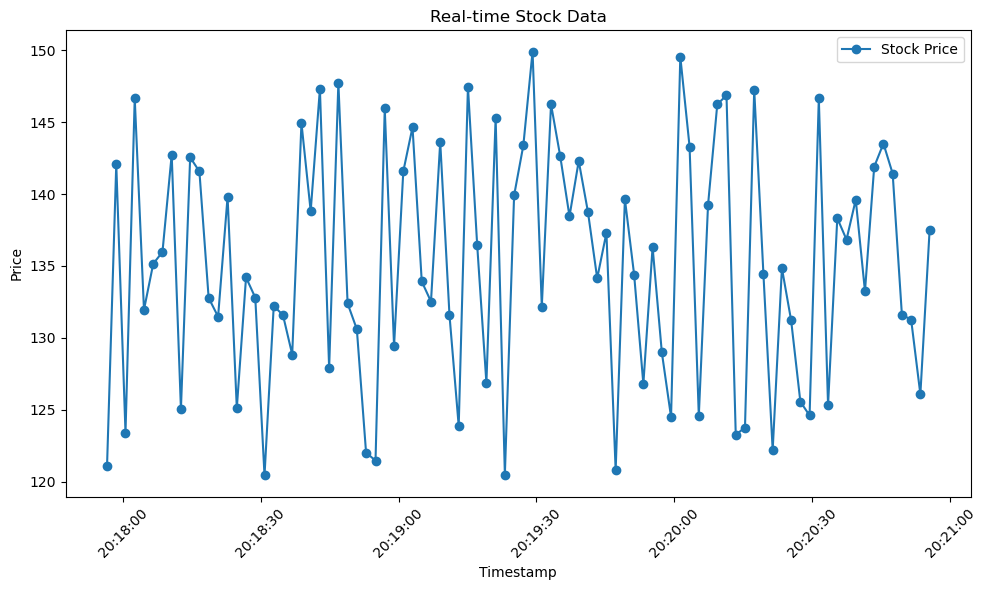

New records received:
  symbol   price                  timestamp
0   AAPL  148.86 2024-12-11 20:20:57.577155


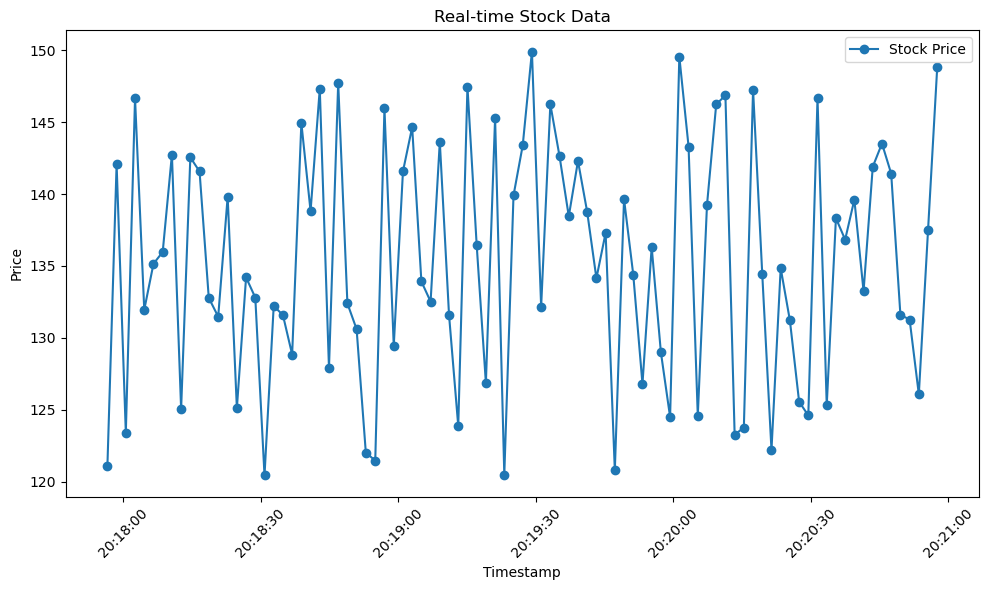

New records received:
  symbol   price                  timestamp
0   AAPL  144.93 2024-12-11 20:20:59.586051


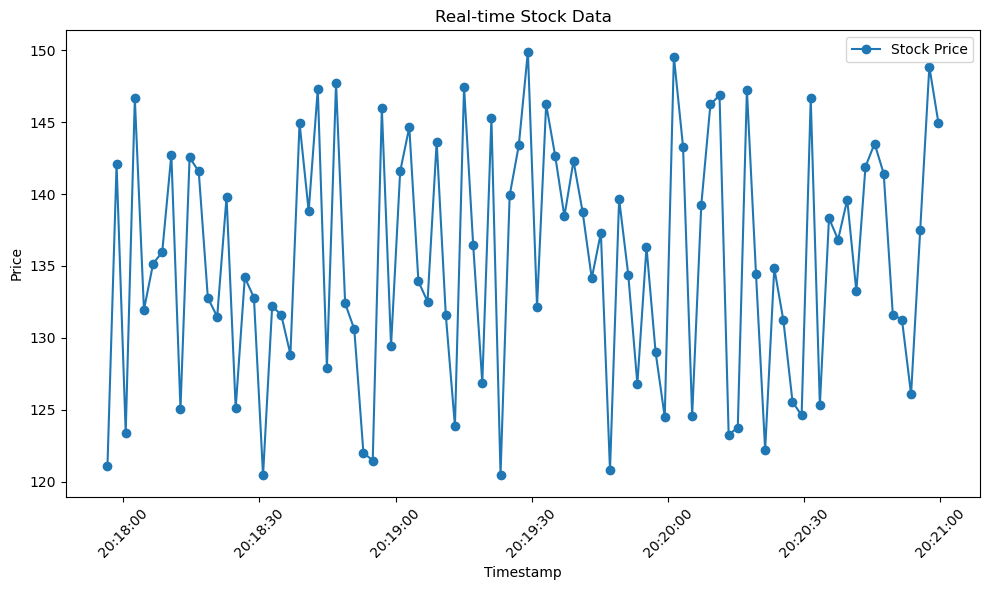

New records received:
  symbol   price                  timestamp
0   AAPL  124.99 2024-12-11 20:21:01.594380
1   AAPL  146.66 2024-12-11 20:21:03.608544


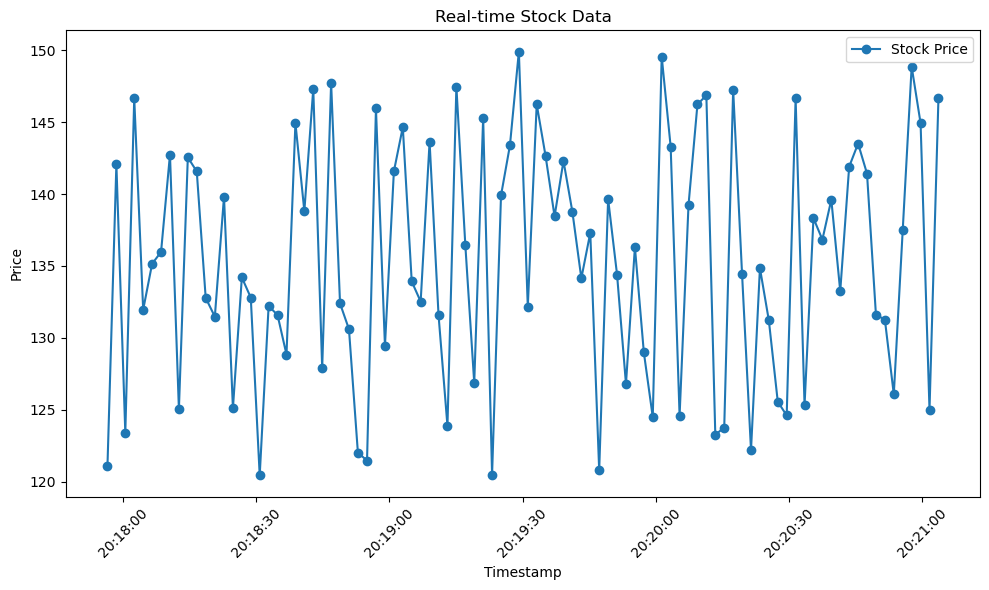

New records received:
  symbol   price                  timestamp
0   AAPL  126.48 2024-12-11 20:21:05.617331


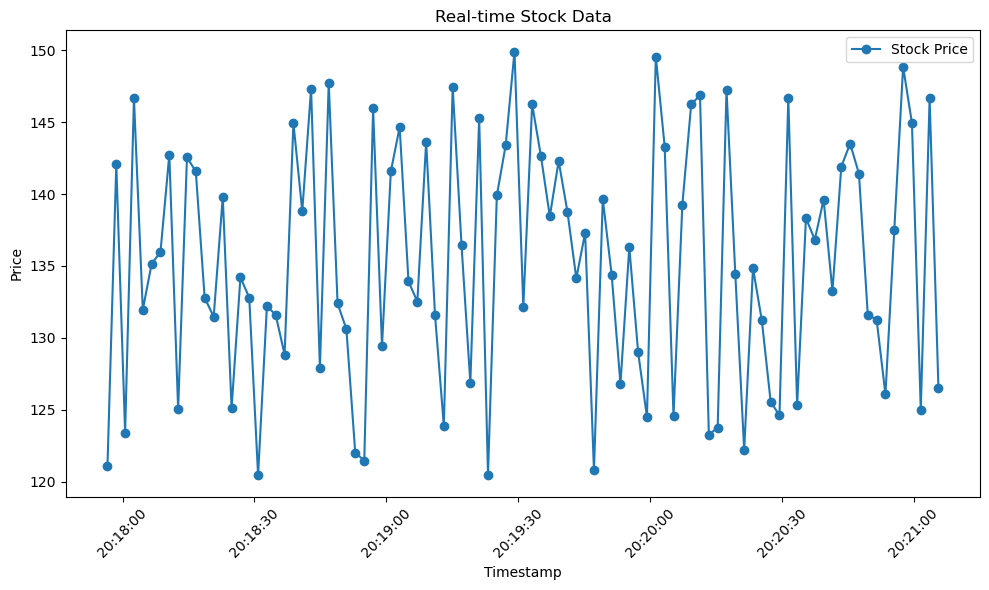

New records received:
  symbol   price                  timestamp
0   AAPL  142.43 2024-12-11 20:21:07.626262


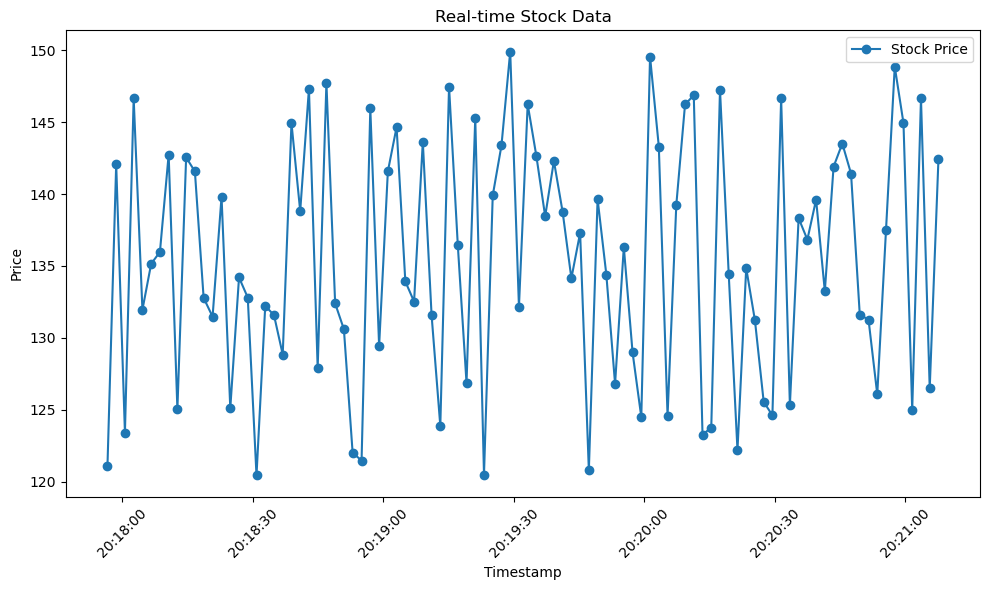

New records received:
  symbol   price                  timestamp
0   AAPL  121.89 2024-12-11 20:21:09.634780


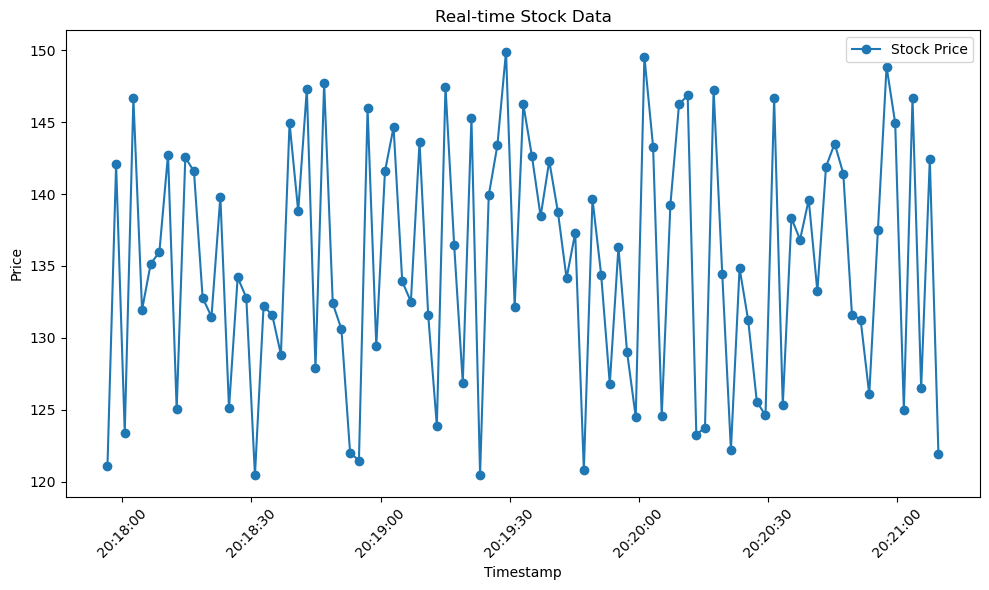

New records received:
  symbol   price                  timestamp
0   AAPL  134.73 2024-12-11 20:21:11.644469


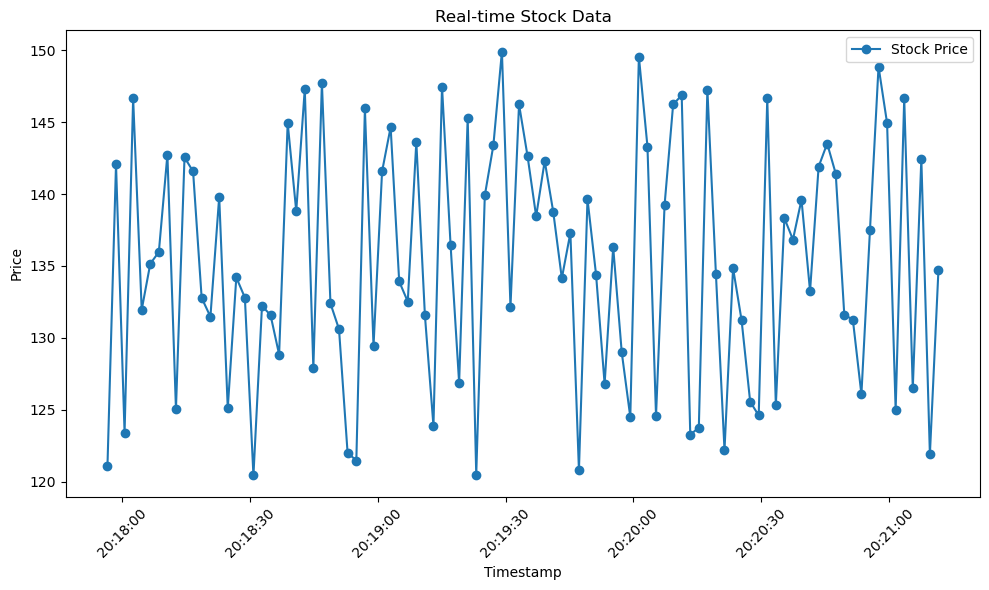

New records received:
  symbol   price                  timestamp
0   AAPL  141.61 2024-12-11 20:21:13.654753


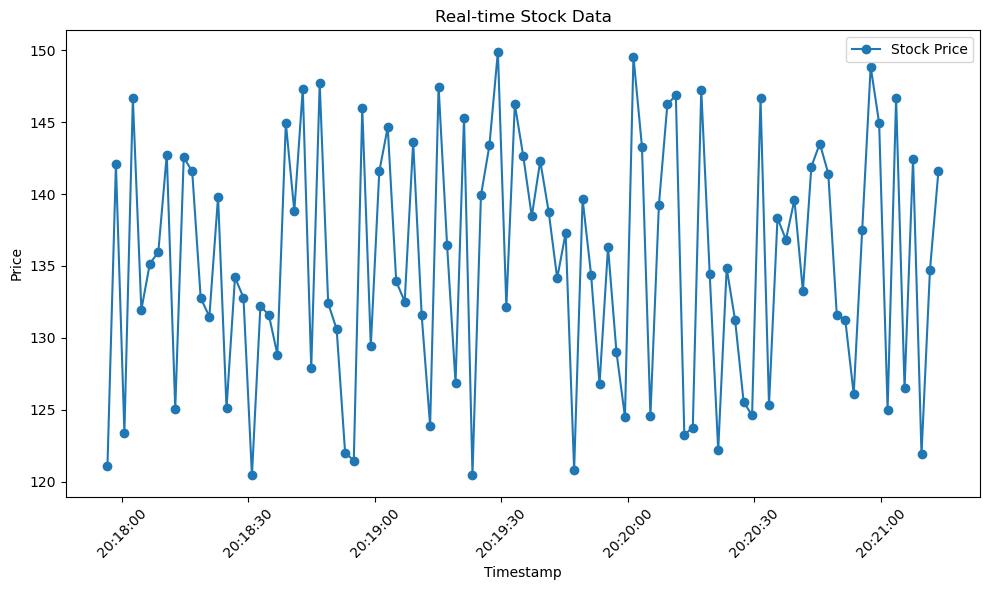

New records received:
  symbol   price                  timestamp
0   AAPL  141.14 2024-12-11 20:21:15.663658
1   AAPL  129.15 2024-12-11 20:21:17.672956


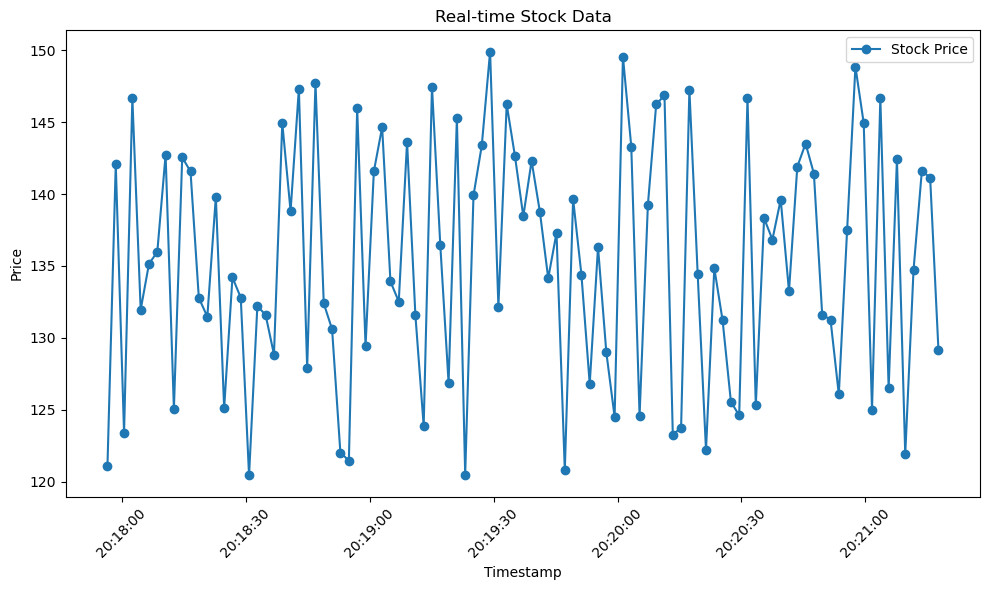

New records received:
  symbol   price                  timestamp
0   AAPL  139.99 2024-12-11 20:21:19.682311


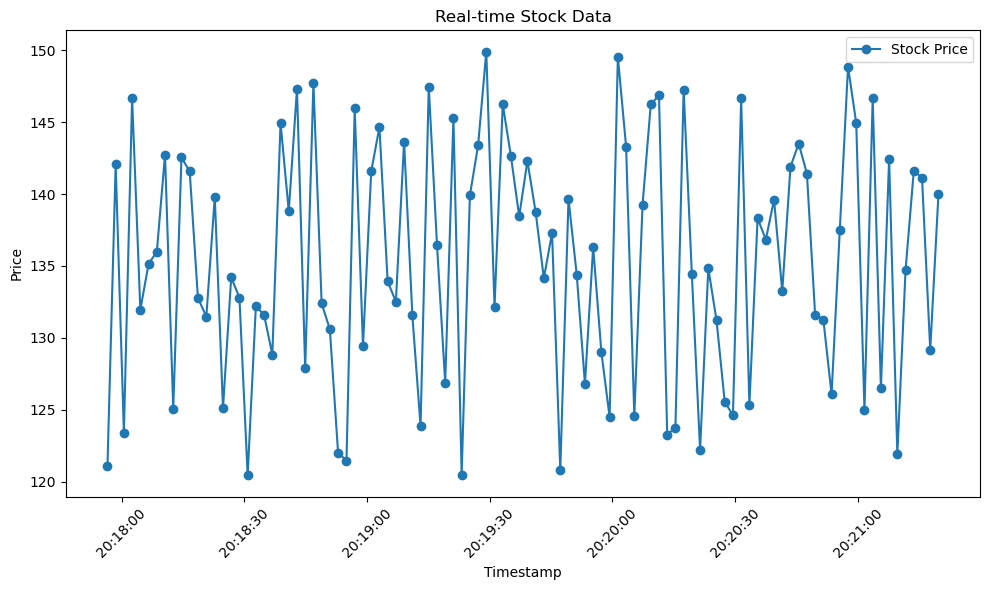

New records received:
  symbol   price                  timestamp
0   AAPL  149.74 2024-12-11 20:21:21.691859


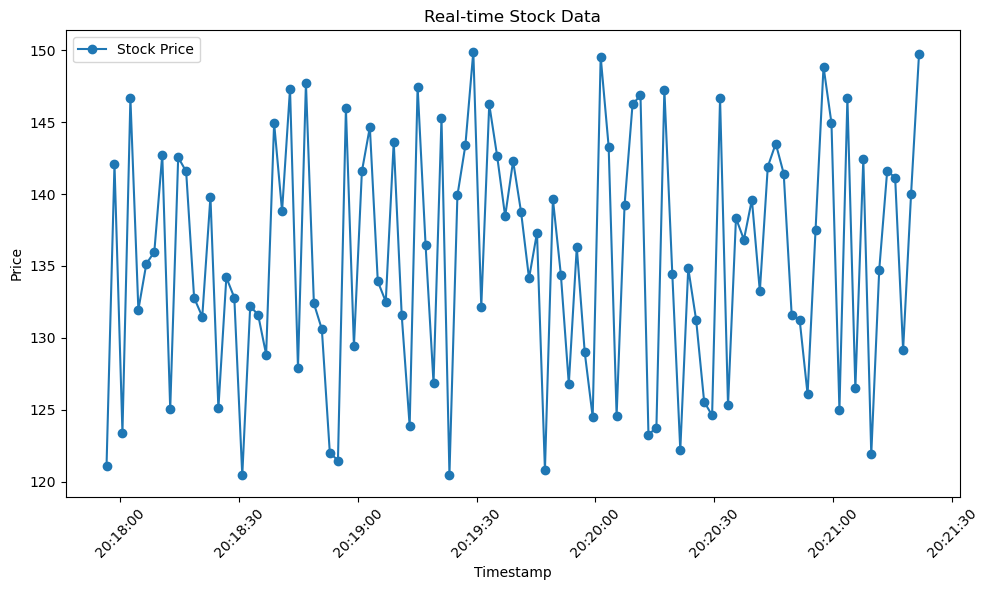

New records received:
  symbol   price                  timestamp
0   AAPL  126.37 2024-12-11 20:21:23.699740


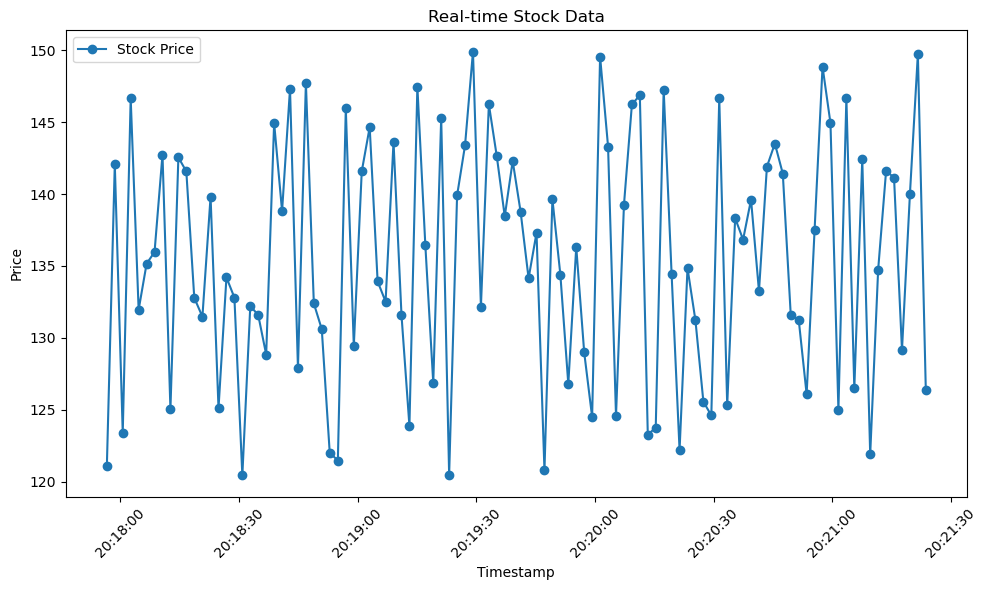

New records received:
  symbol   price                  timestamp
0   AAPL  146.92 2024-12-11 20:21:25.707100


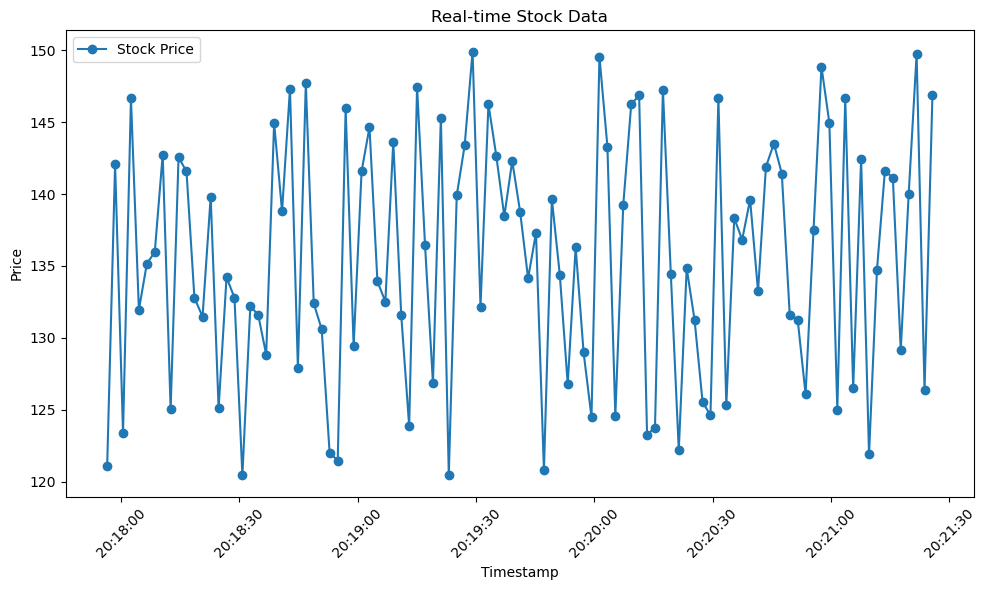

New records received:
  symbol   price                  timestamp
0   AAPL  134.45 2024-12-11 20:21:27.715858
1   AAPL  141.81 2024-12-11 20:21:29.730795


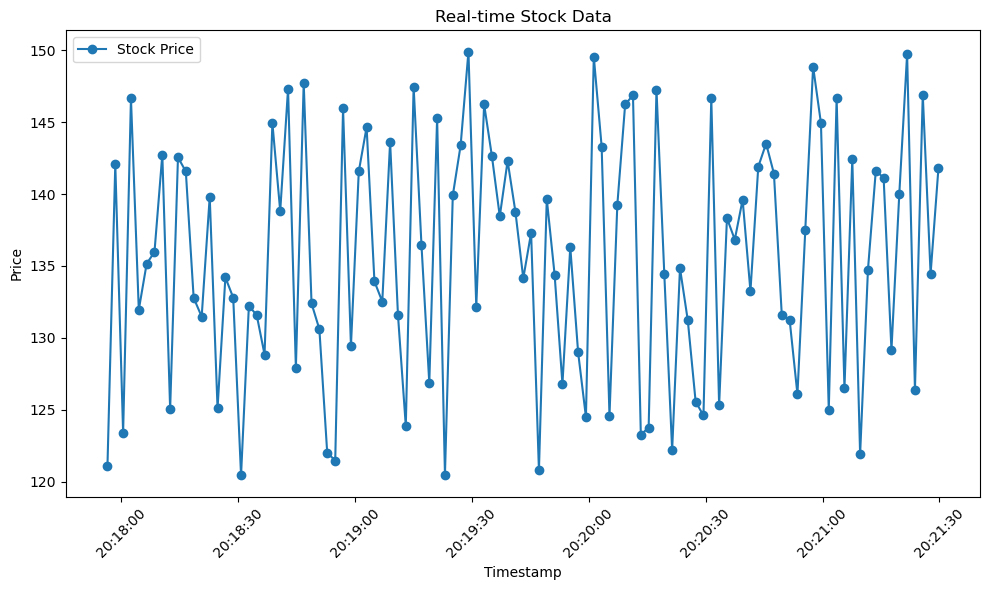

New records received:
  symbol   price                  timestamp
0   AAPL  148.38 2024-12-11 20:21:31.744250


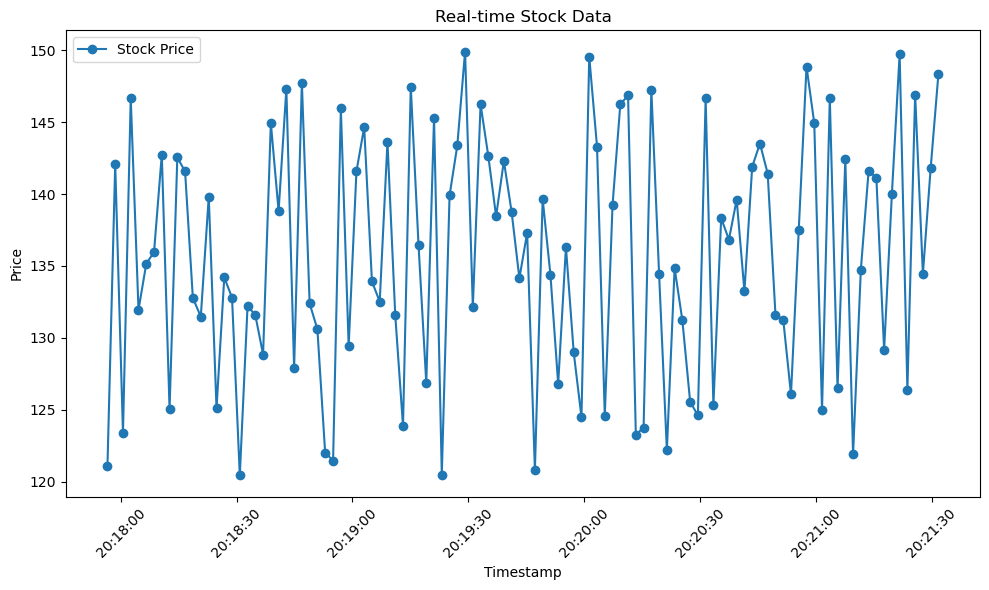

New records received:
  symbol   price                  timestamp
0   AAPL  126.01 2024-12-11 20:21:33.753080


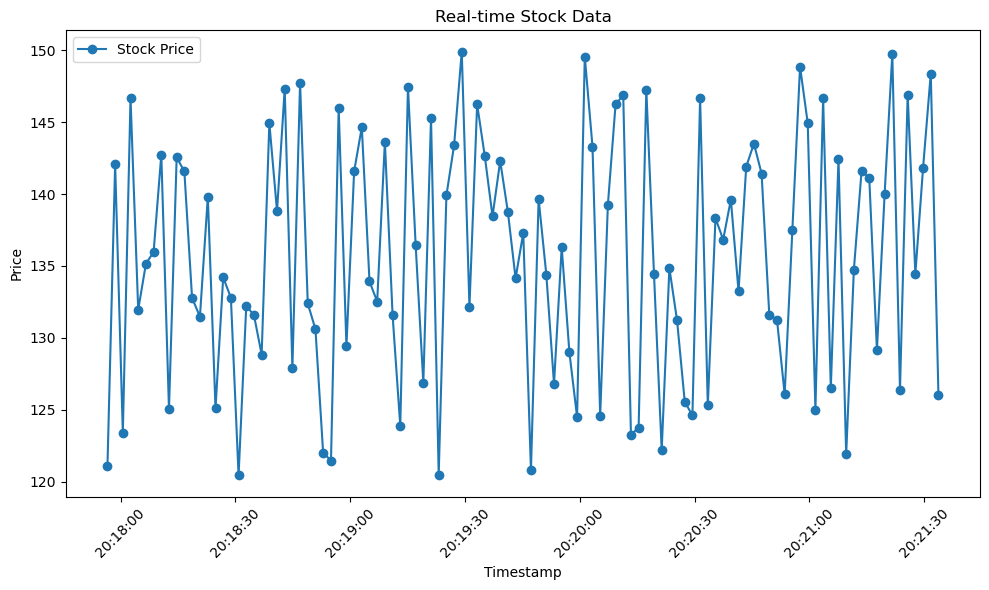

New records received:
  symbol   price                  timestamp
0   AAPL  126.41 2024-12-11 20:21:35.763048


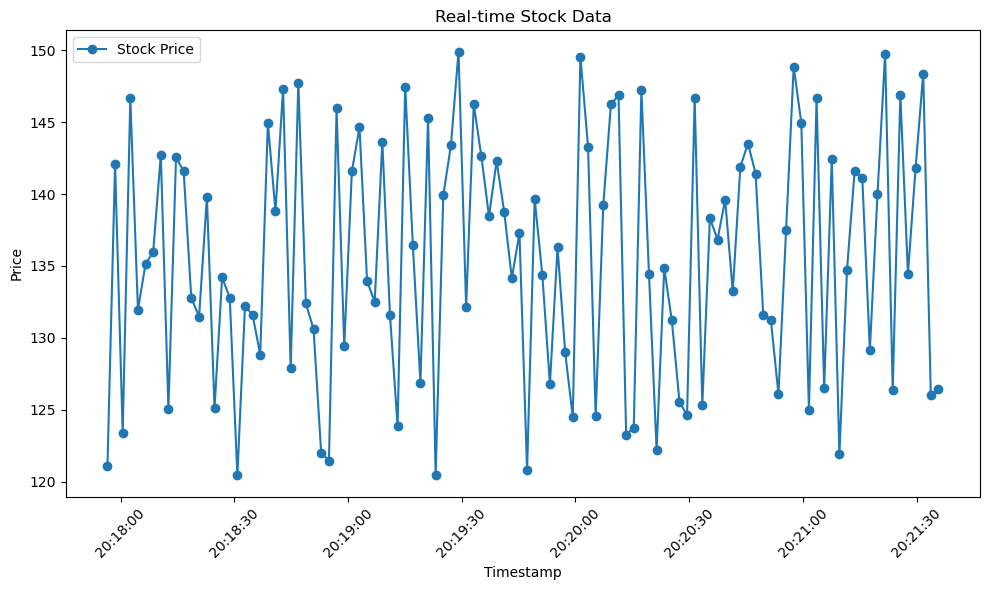

New records received:
  symbol   price                  timestamp
0   AAPL  146.52 2024-12-11 20:21:37.773135


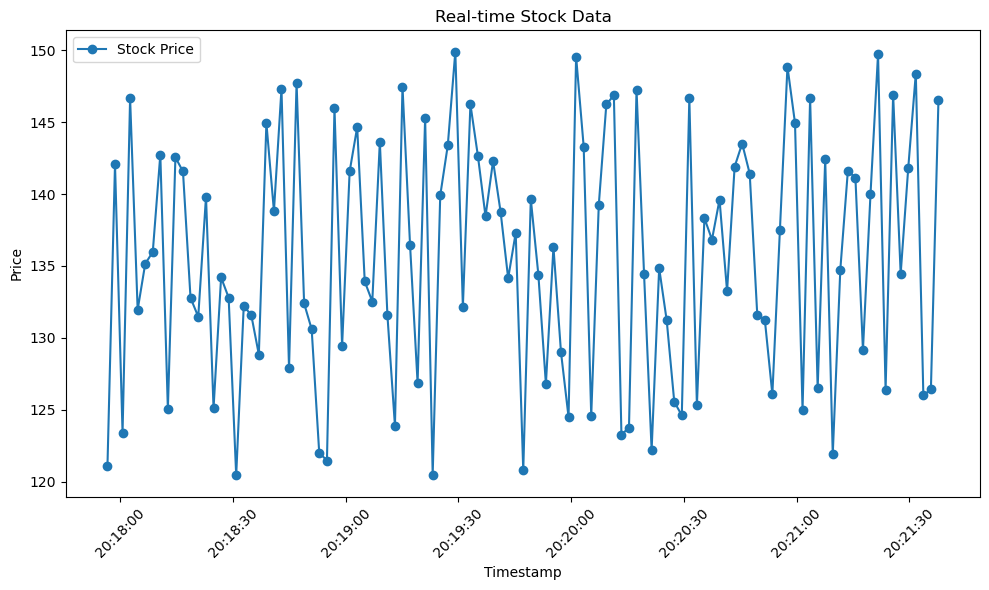

New records received:
  symbol   price                  timestamp
0   AAPL  130.04 2024-12-11 20:21:39.783715
1   AAPL  138.21 2024-12-11 20:21:41.793502


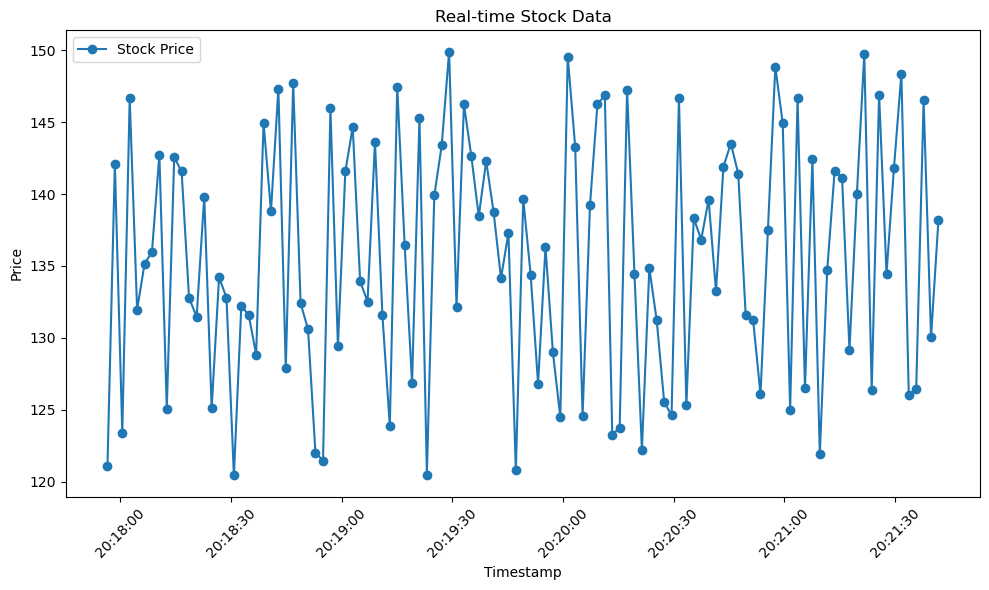

New records received:
  symbol   price                  timestamp
0   AAPL  145.48 2024-12-11 20:21:43.800948


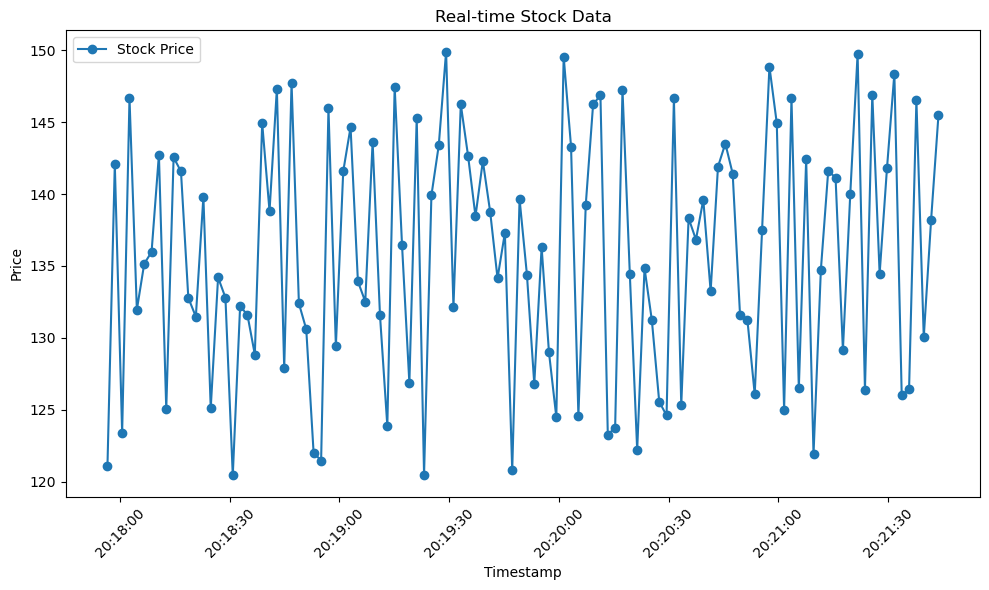

New records received:
  symbol   price                  timestamp
0   AAPL  146.13 2024-12-11 20:21:45.810364


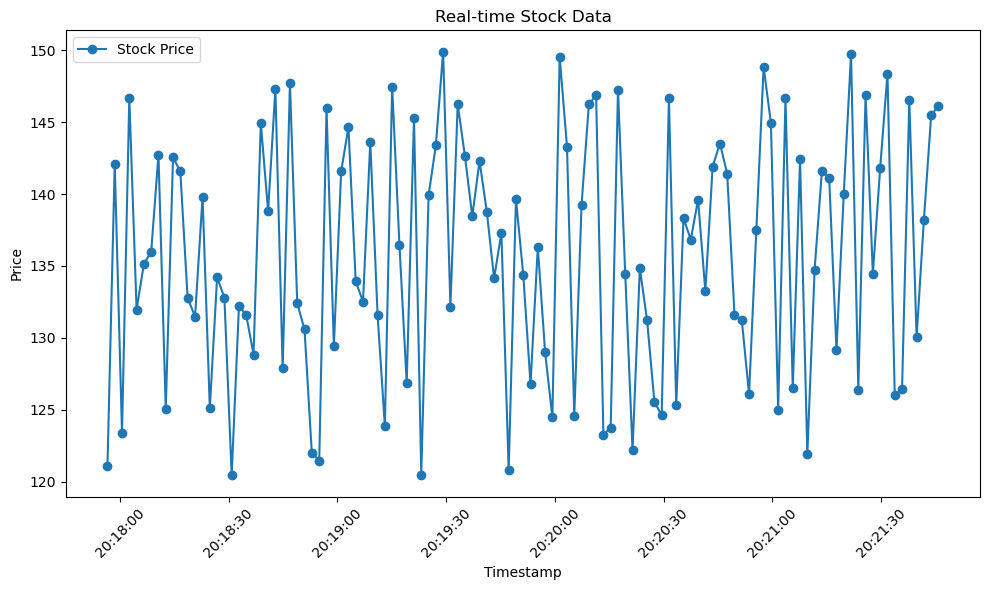

New records received:
  symbol   price                  timestamp
0   AAPL  138.77 2024-12-11 20:21:47.818785


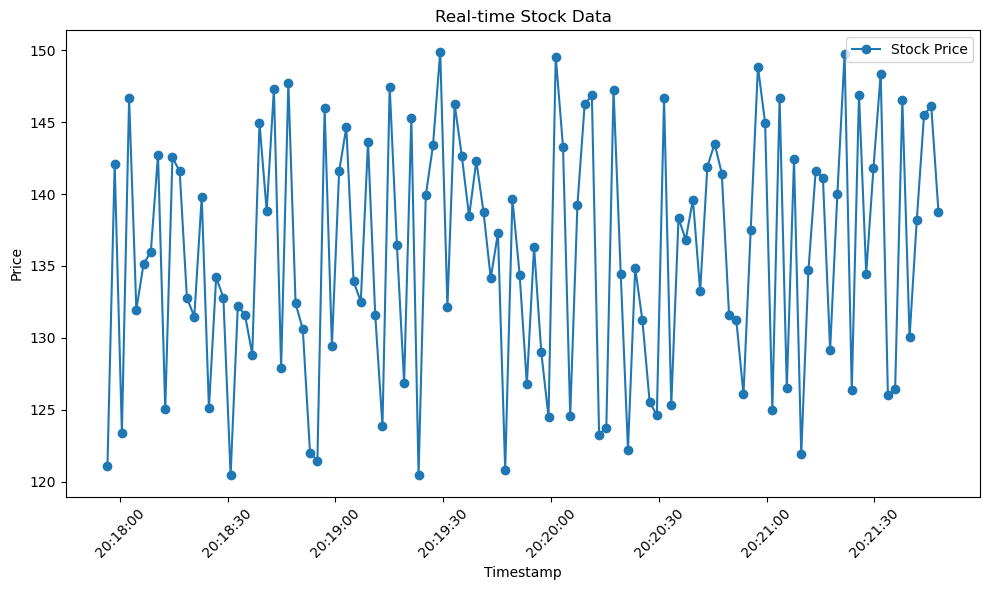

New records received:
  symbol   price                  timestamp
0   AAPL  149.51 2024-12-11 20:21:49.831933


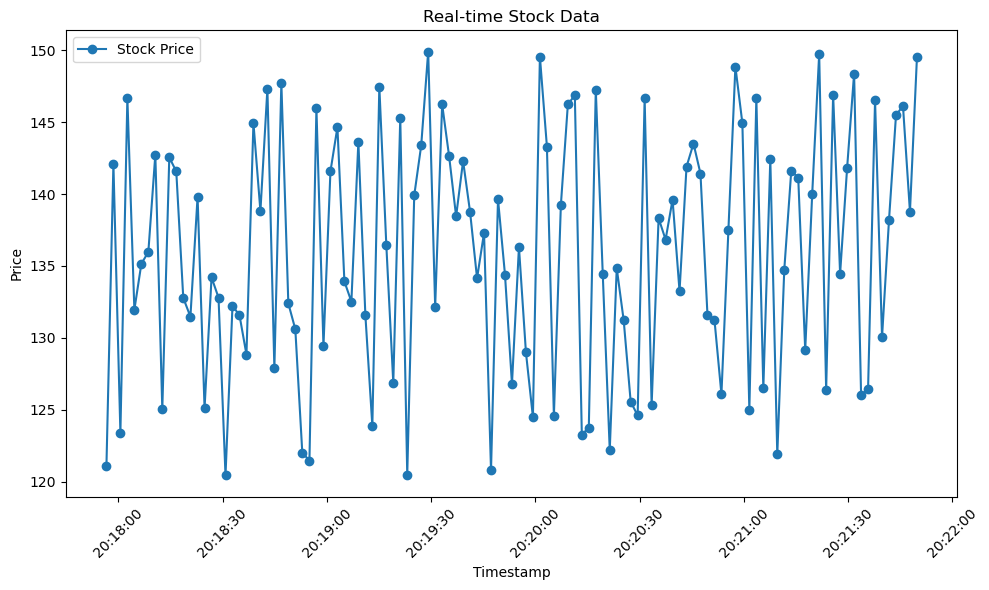

New records received:
  symbol   price                  timestamp
0   AAPL  137.58 2024-12-11 20:21:51.841337


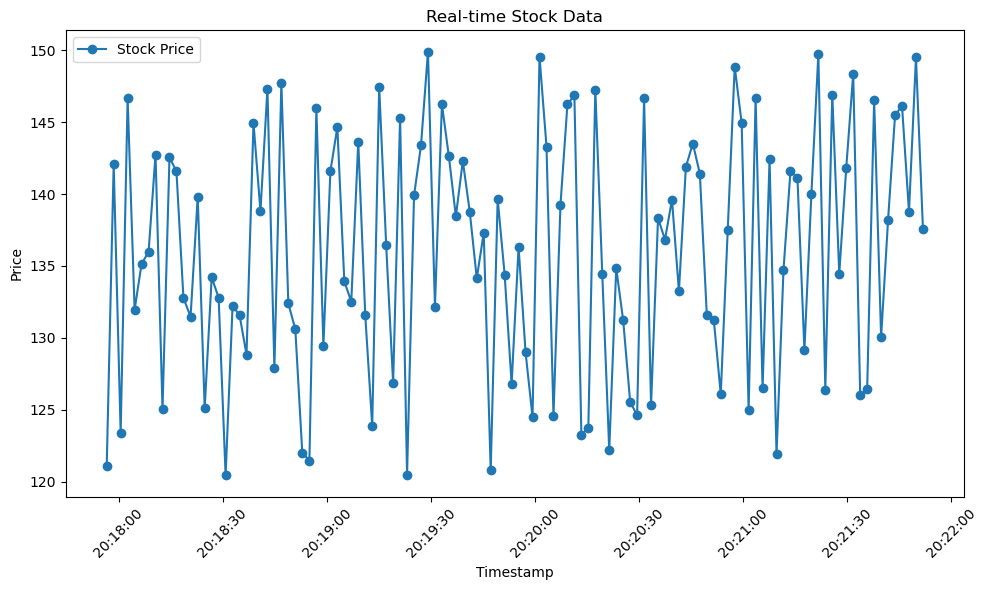

New records received:
  symbol   price                  timestamp
0   AAPL  121.89 2024-12-11 20:21:53.852419
1   AAPL  138.48 2024-12-11 20:21:55.862403


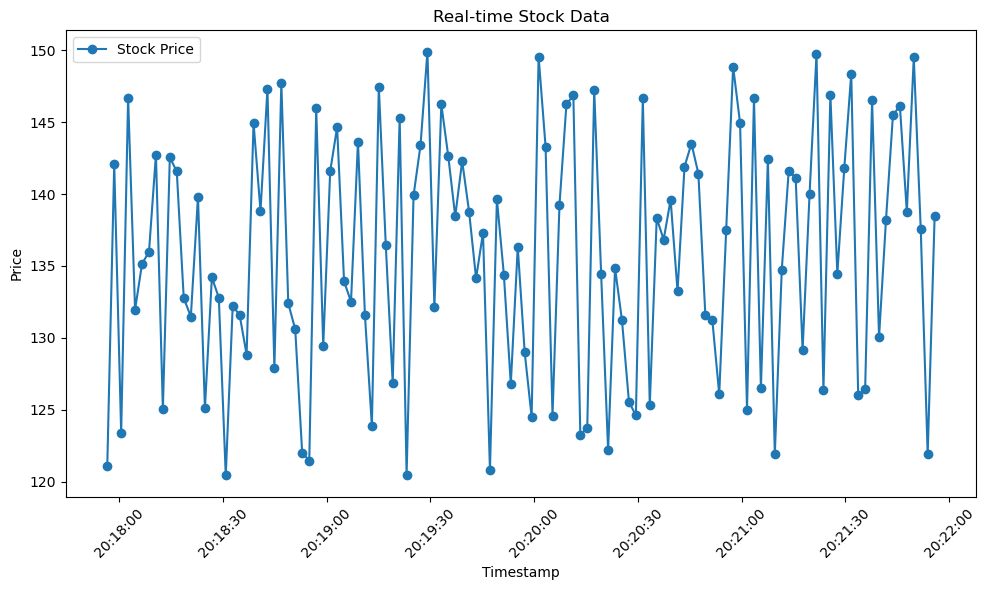

New records received:
  symbol   price                  timestamp
0   AAPL  127.63 2024-12-11 20:21:57.871173


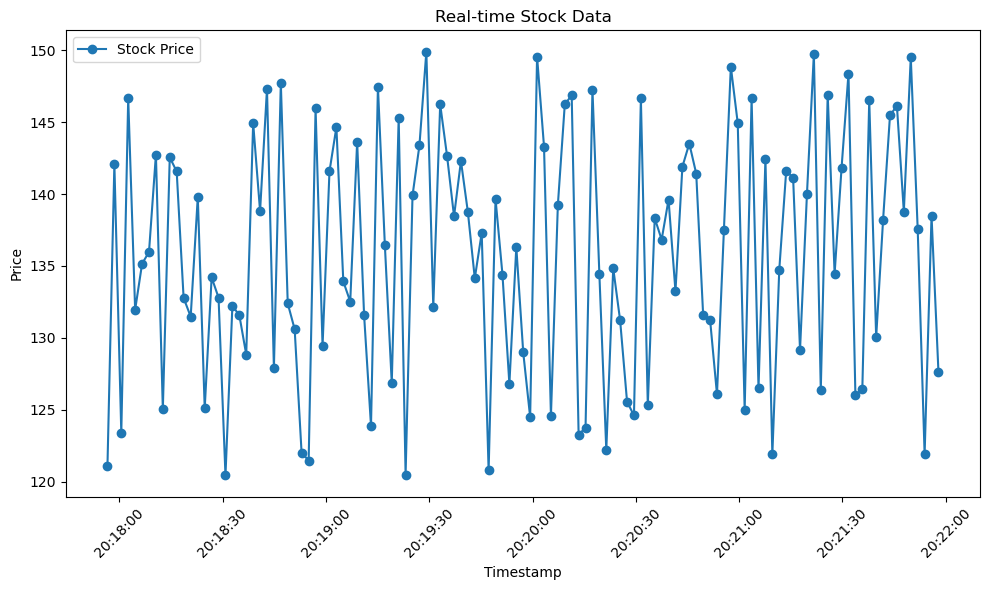

New records received:
  symbol  price                  timestamp
0   AAPL  142.7 2024-12-11 20:21:59.899878


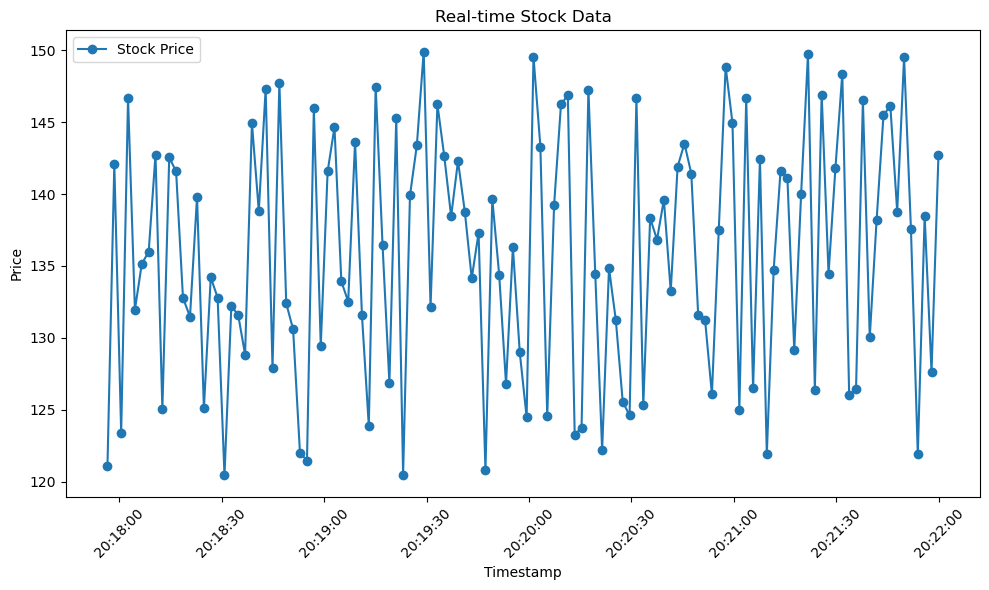

New records received:
  symbol   price                  timestamp
0   AAPL  142.75 2024-12-11 20:22:01.912679


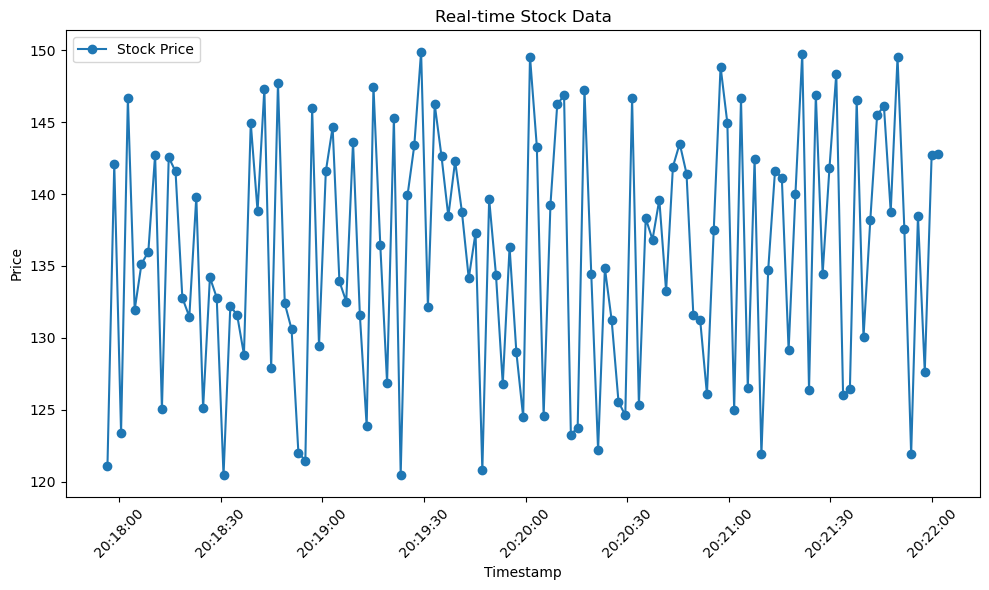

New records received:
  symbol   price                  timestamp
0   AAPL  130.69 2024-12-11 20:22:03.925539


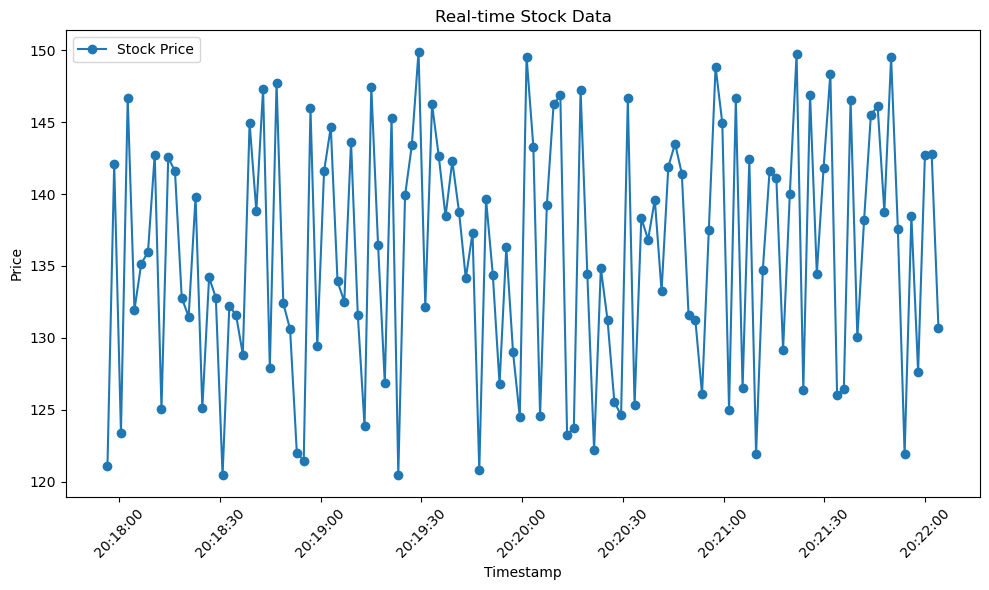

New records received:
  symbol   price                  timestamp
0   AAPL  139.86 2024-12-11 20:22:05.934848
1   AAPL  137.63 2024-12-11 20:22:07.944034


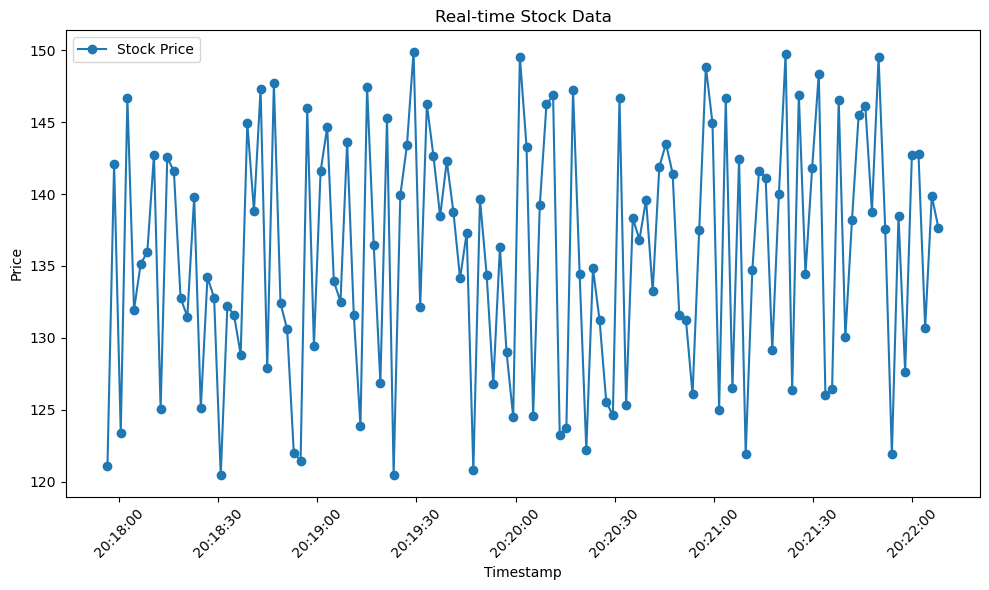

New records received:
  symbol   price                  timestamp
0   AAPL  134.12 2024-12-11 20:22:09.957470


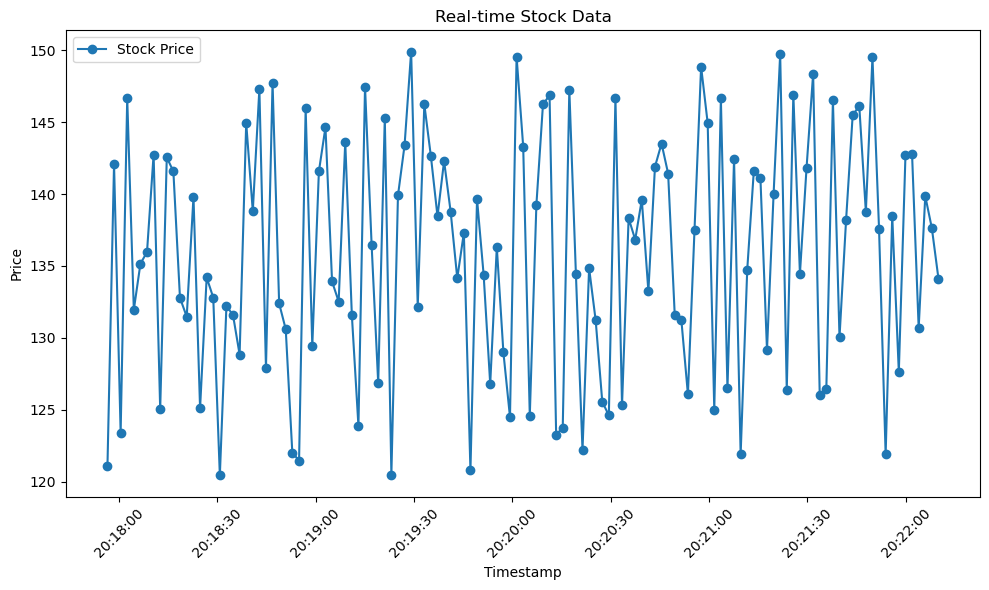

New records received:
  symbol   price                  timestamp
0   AAPL  134.17 2024-12-11 20:22:11.968975


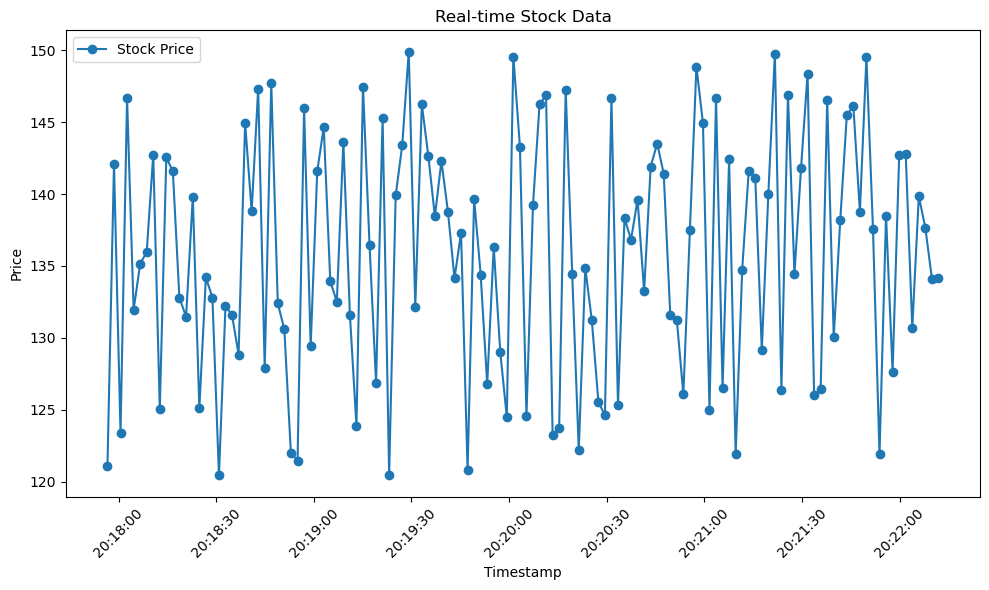

New records received:
  symbol   price                  timestamp
0   AAPL  123.06 2024-12-11 20:22:13.978197


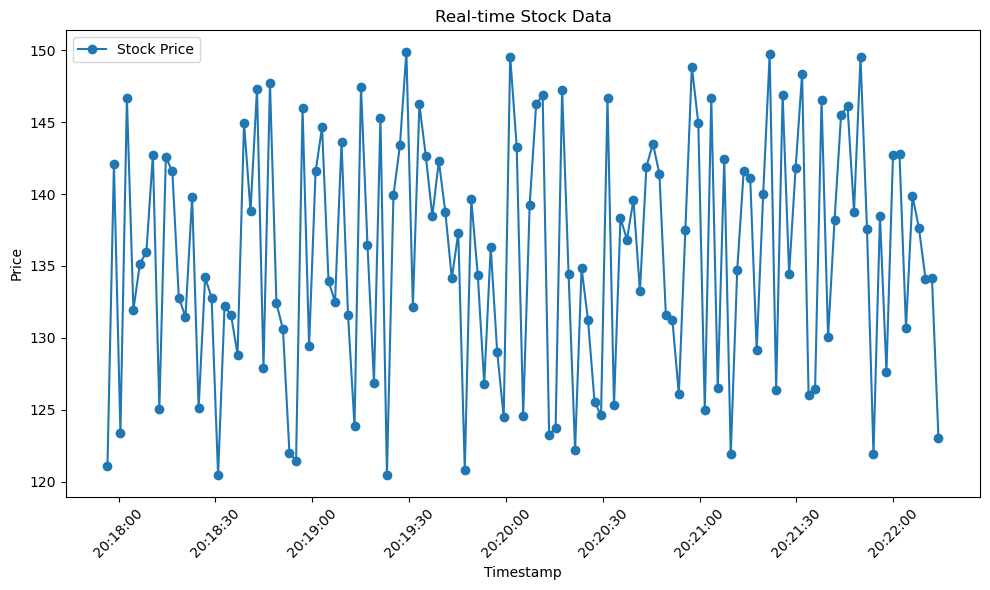

New records received:
  symbol   price                  timestamp
0   AAPL  134.37 2024-12-11 20:22:16.031149


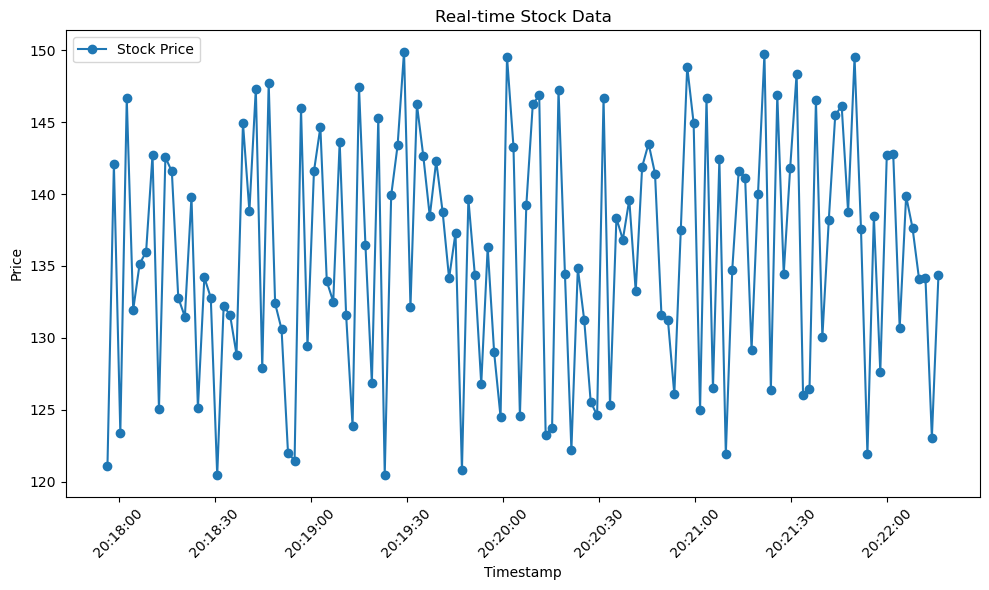

New records received:
  symbol   price                  timestamp
0   AAPL  147.65 2024-12-11 20:22:18.048029


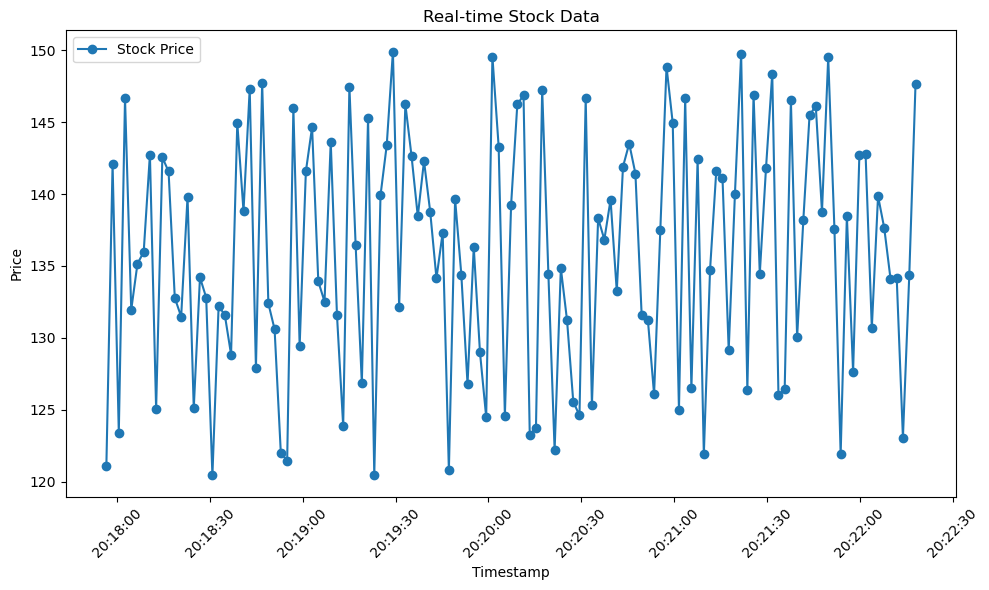

New records received:
  symbol   price                  timestamp
0   AAPL  130.53 2024-12-11 20:22:20.061622
1   AAPL  147.36 2024-12-11 20:22:22.071553


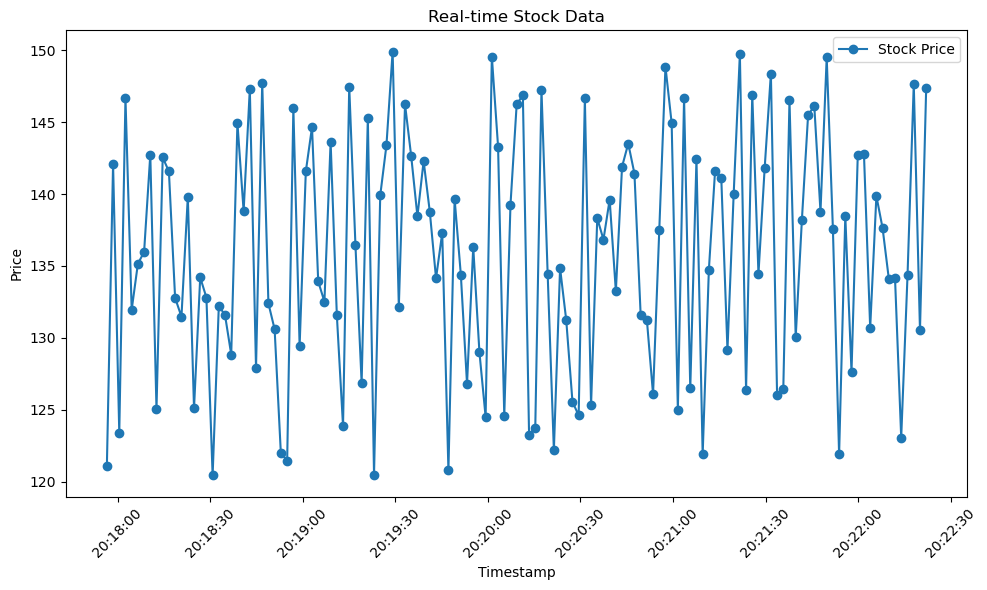

New records received:
  symbol   price                  timestamp
0   AAPL  141.76 2024-12-11 20:22:24.081383


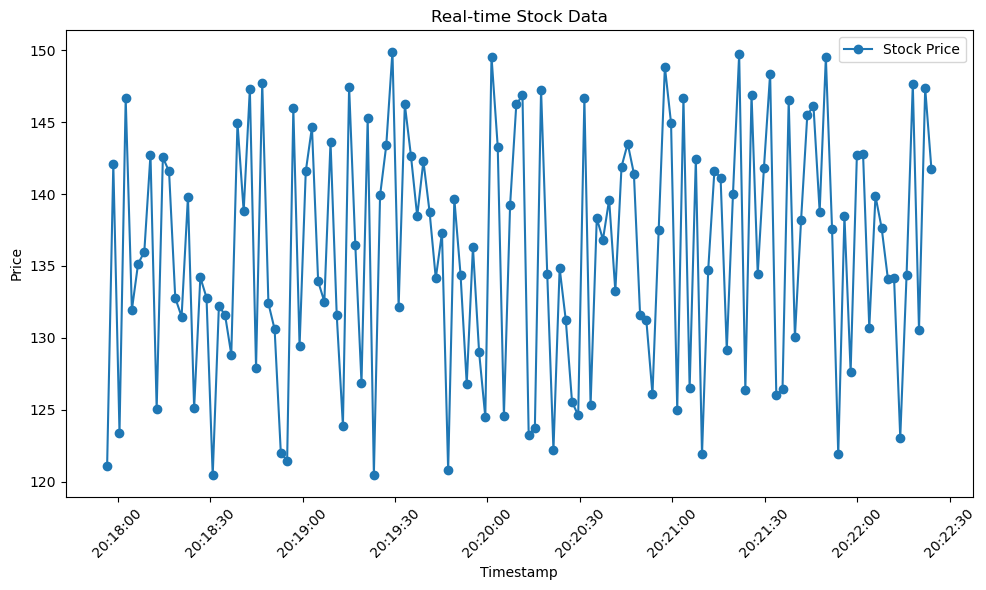

New records received:
  symbol   price                  timestamp
0   AAPL  148.36 2024-12-11 20:22:26.090055


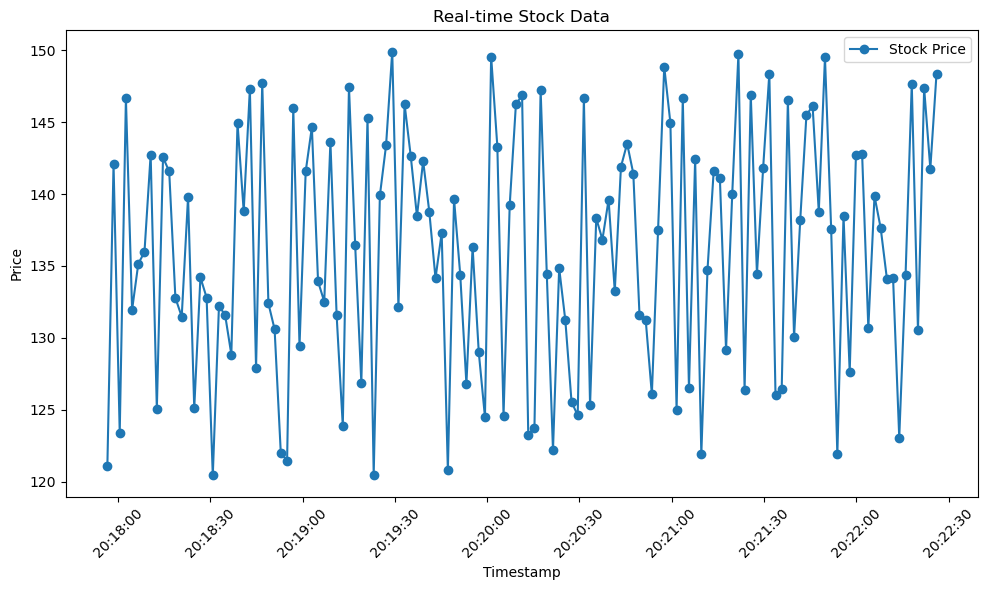

New records received:
  symbol   price                  timestamp
0   AAPL  149.32 2024-12-11 20:22:28.098571


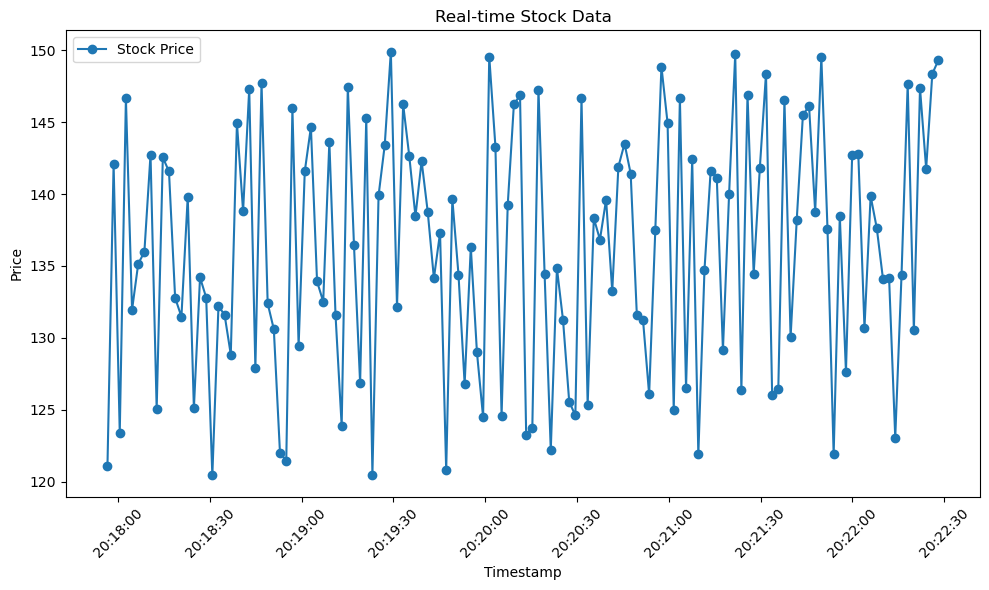

New records received:
  symbol   price                  timestamp
0   AAPL  149.64 2024-12-11 20:22:30.107051


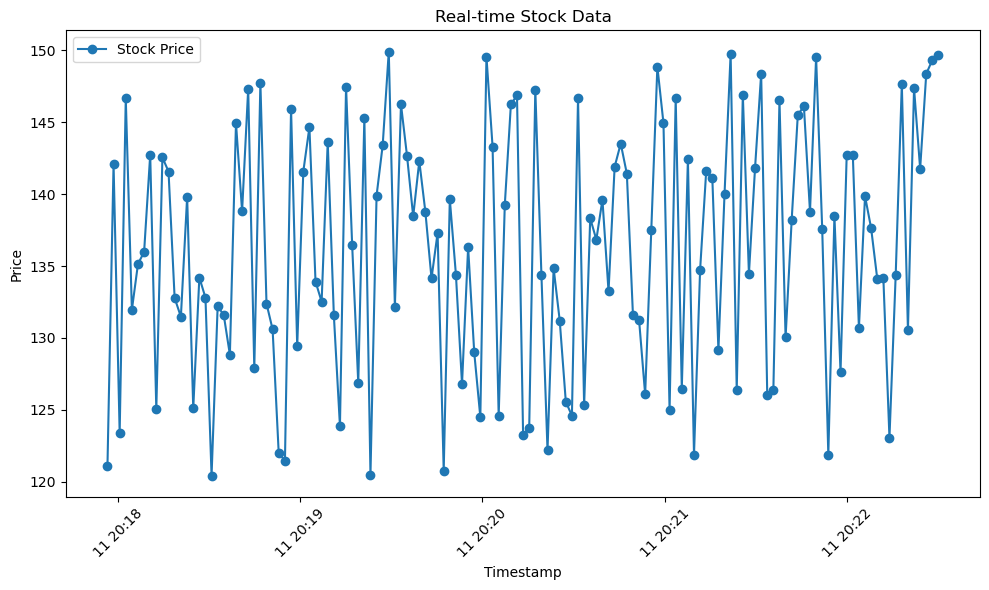

New records received:
  symbol   price                  timestamp
0   AAPL  126.55 2024-12-11 20:22:32.115275


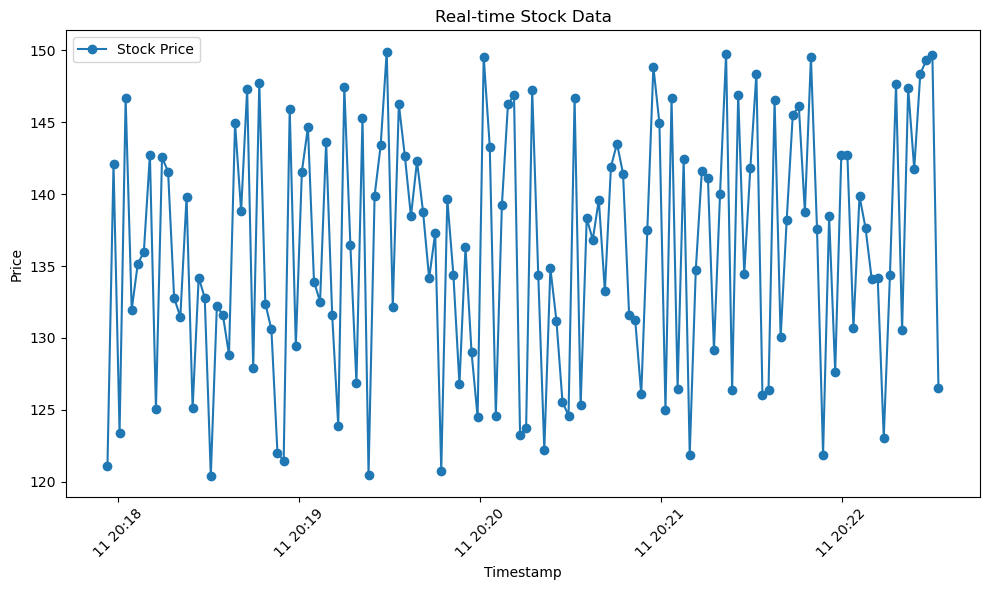

New records received:
  symbol   price                  timestamp
0   AAPL  123.23 2024-12-11 20:22:34.146935
1   AAPL  149.61 2024-12-11 20:22:36.163520


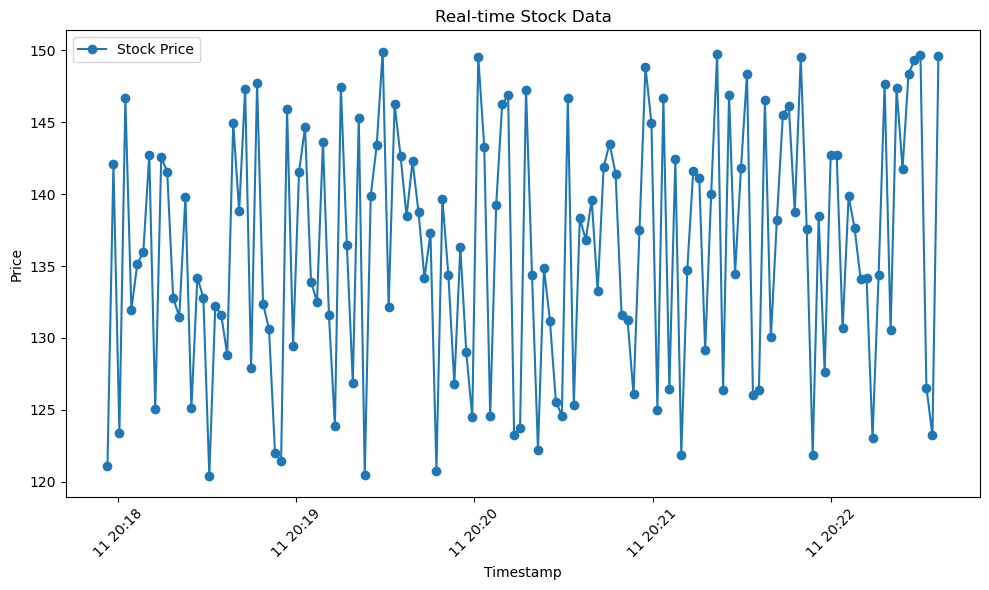

New records received:
  symbol  price                  timestamp
0   AAPL  134.1 2024-12-11 20:22:38.173044


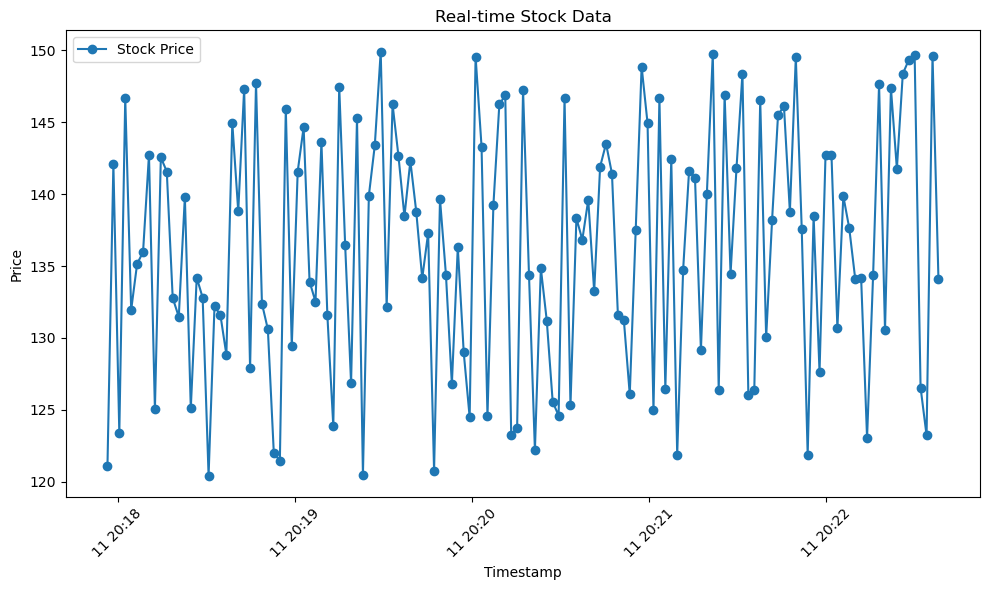

New records received:
  symbol   price                  timestamp
0   AAPL  124.94 2024-12-11 20:22:40.183309


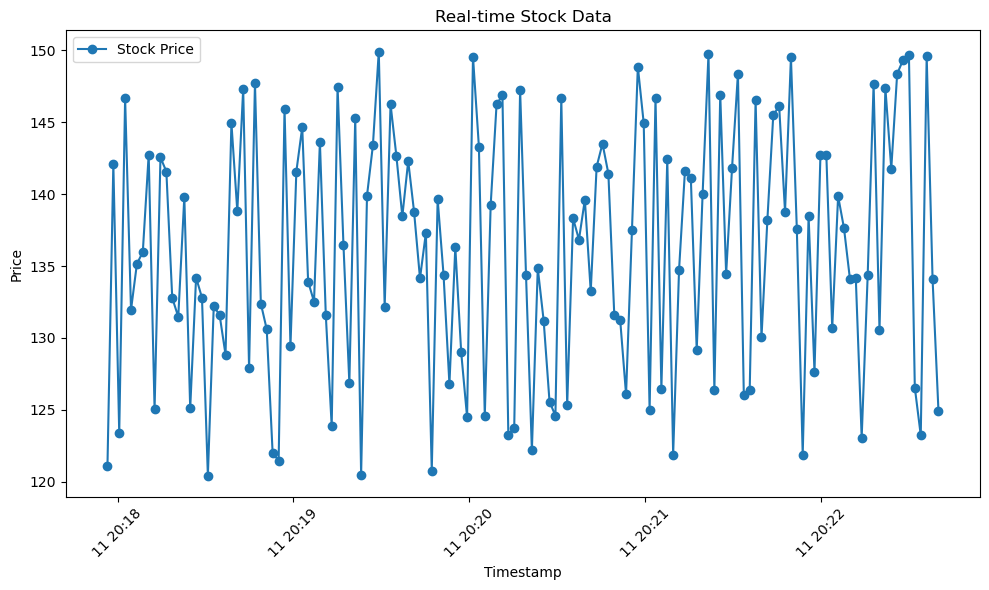

New records received:
  symbol   price                  timestamp
0   AAPL  146.68 2024-12-11 20:22:42.196252


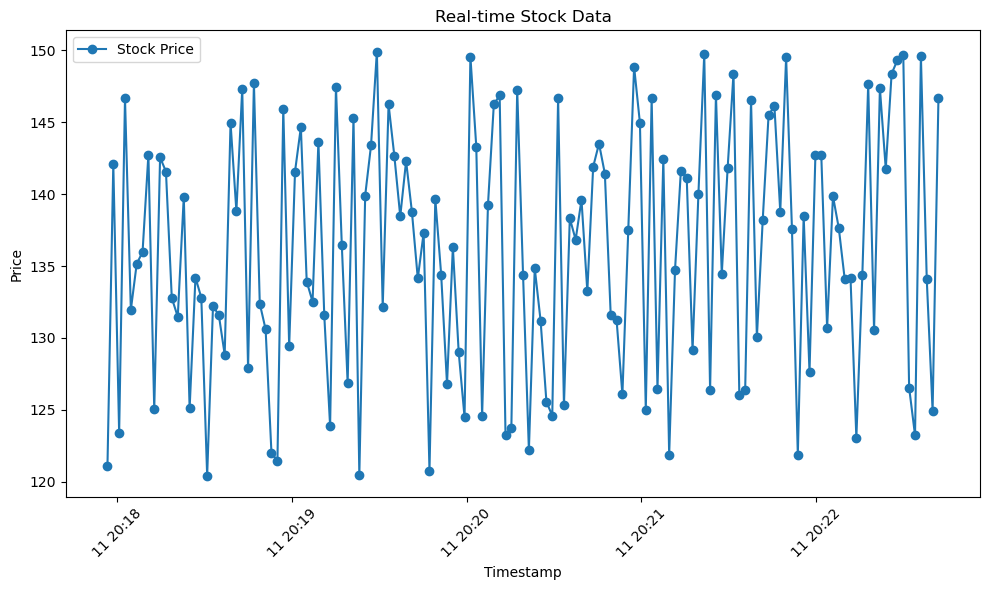

New records received:
  symbol   price                  timestamp
0   AAPL  126.22 2024-12-11 20:22:44.204547


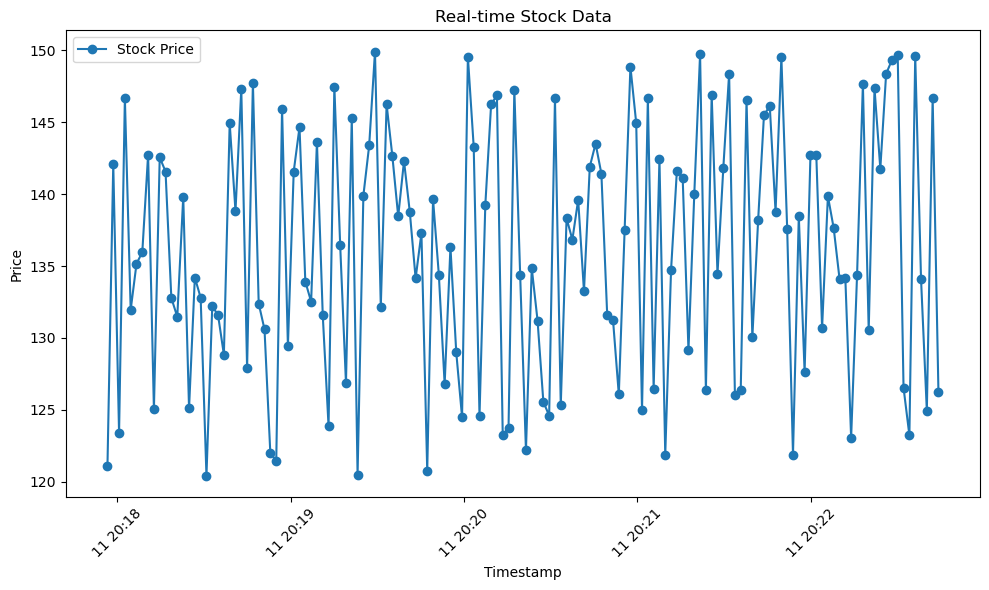

New records received:
  symbol   price                  timestamp
0   AAPL  136.06 2024-12-11 20:22:46.350321


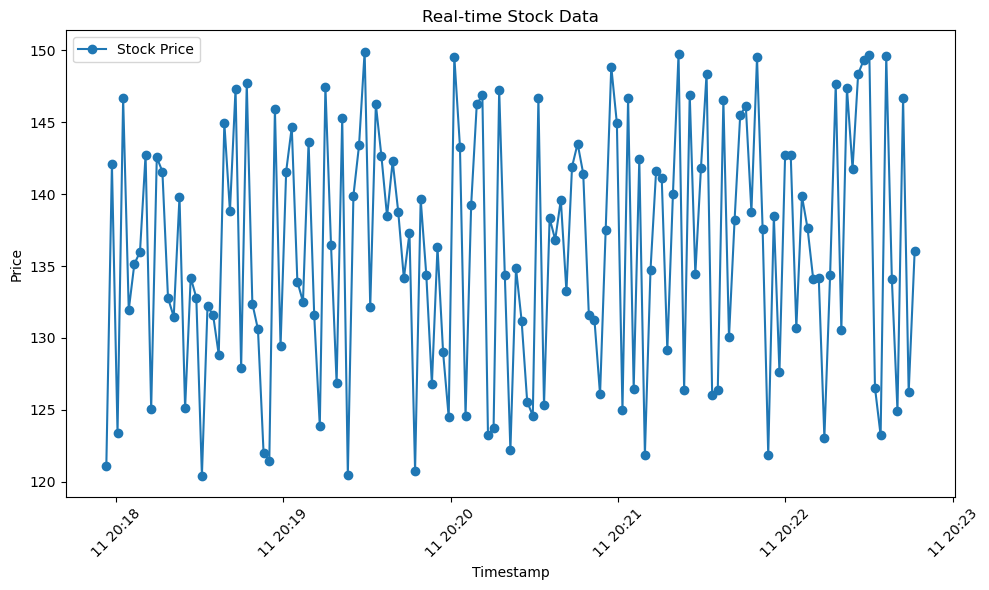

New records received:
  symbol   price                  timestamp
0   AAPL  138.06 2024-12-11 20:22:48.361028
1   AAPL  124.29 2024-12-11 20:22:50.378978


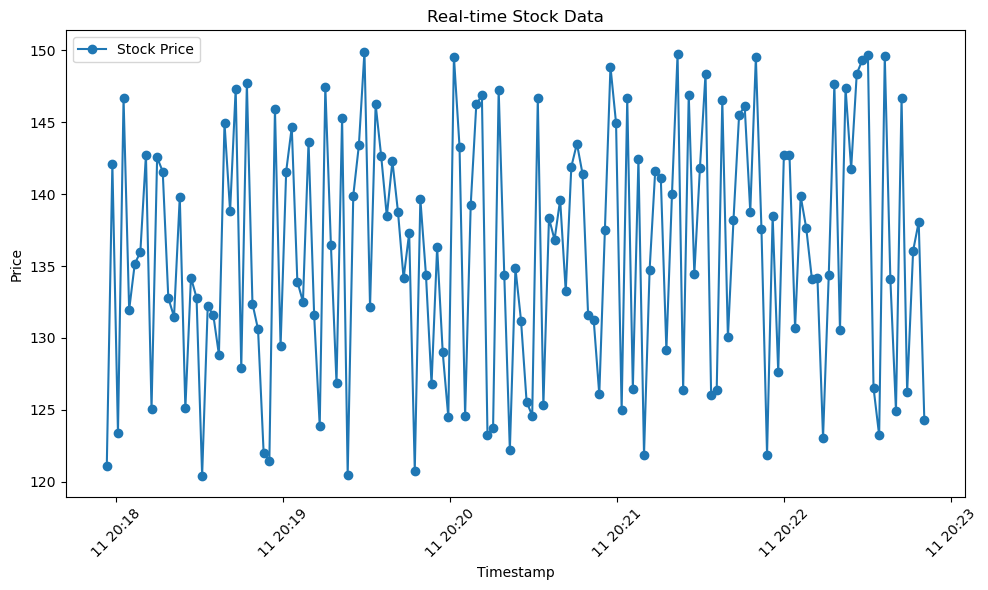

New records received:
  symbol   price                  timestamp
0   AAPL  135.39 2024-12-11 20:22:52.388608


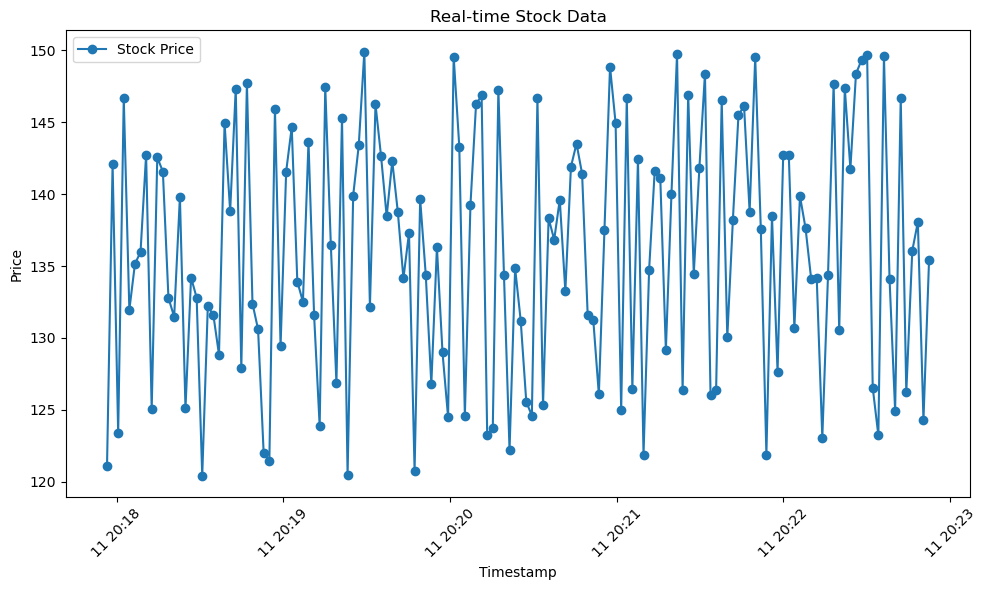

New records received:
  symbol   price                  timestamp
0   AAPL  144.17 2024-12-11 20:22:54.417400


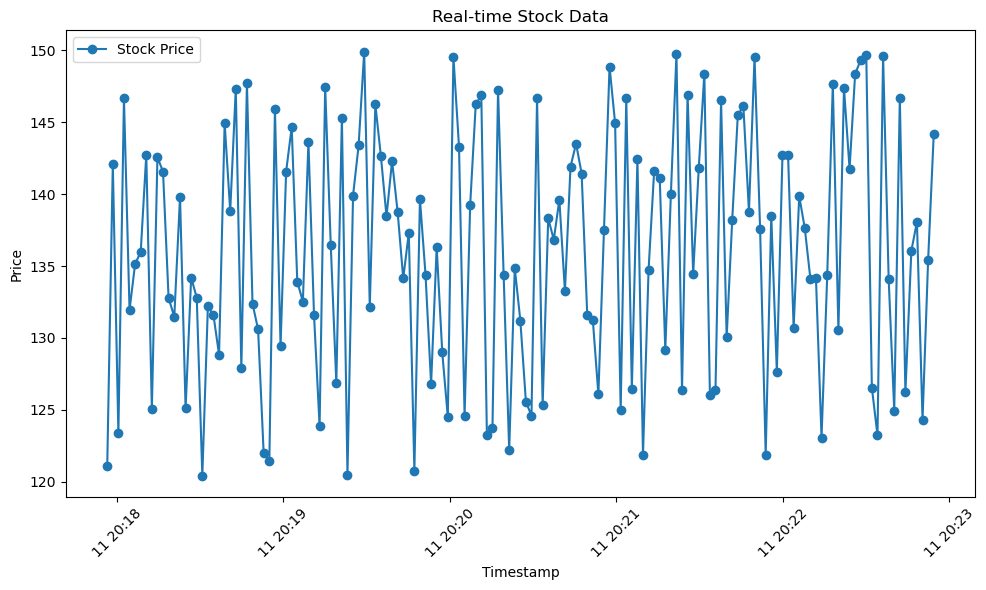

New records received:
  symbol   price                  timestamp
0   AAPL  131.93 2024-12-11 20:22:56.426997


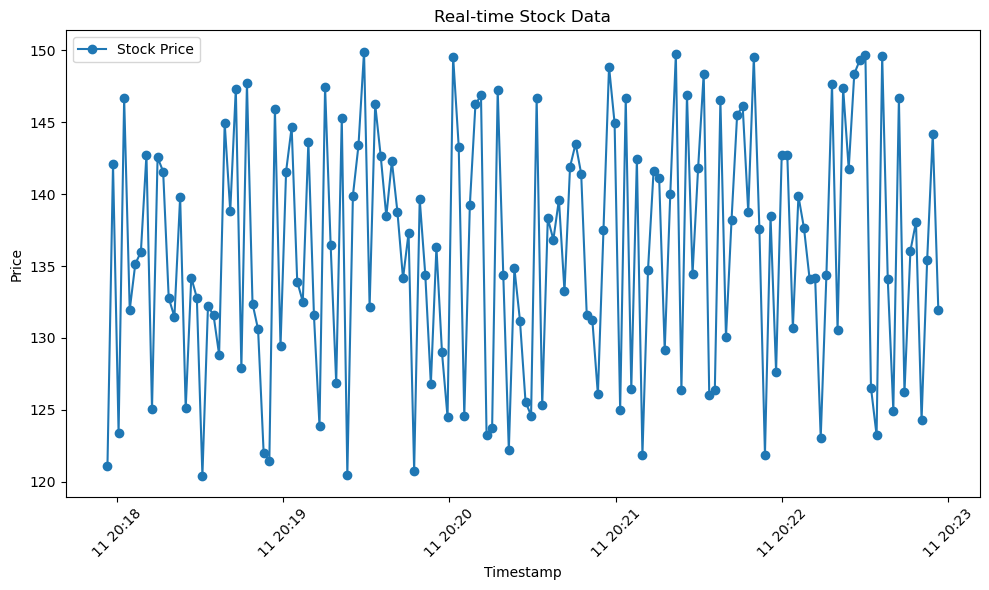

New records received:
  symbol   price                  timestamp
0   AAPL  129.51 2024-12-11 20:22:58.436181


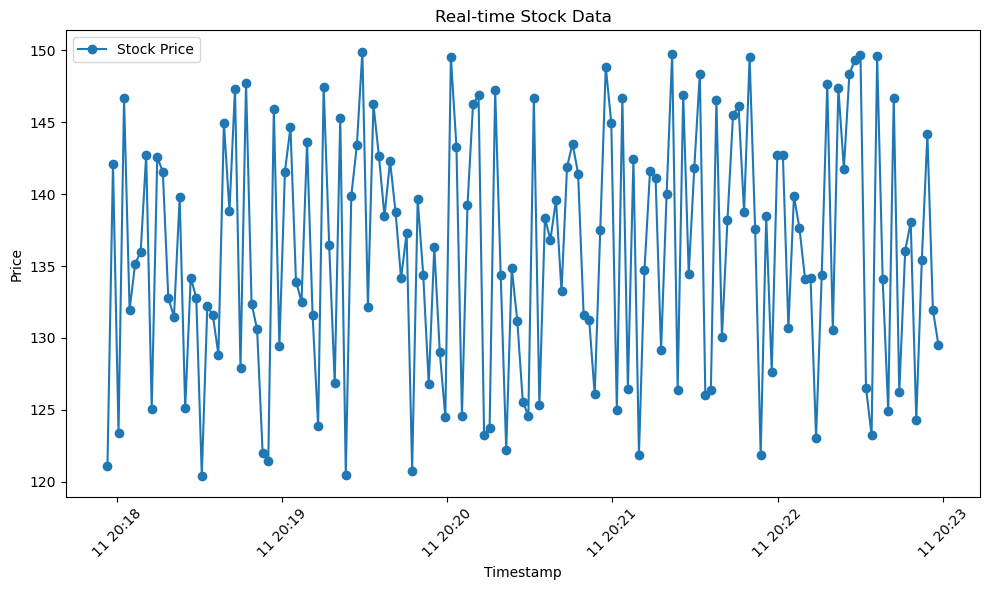

New records received:
  symbol   price                  timestamp
0   AAPL  136.17 2024-12-11 20:23:00.444755


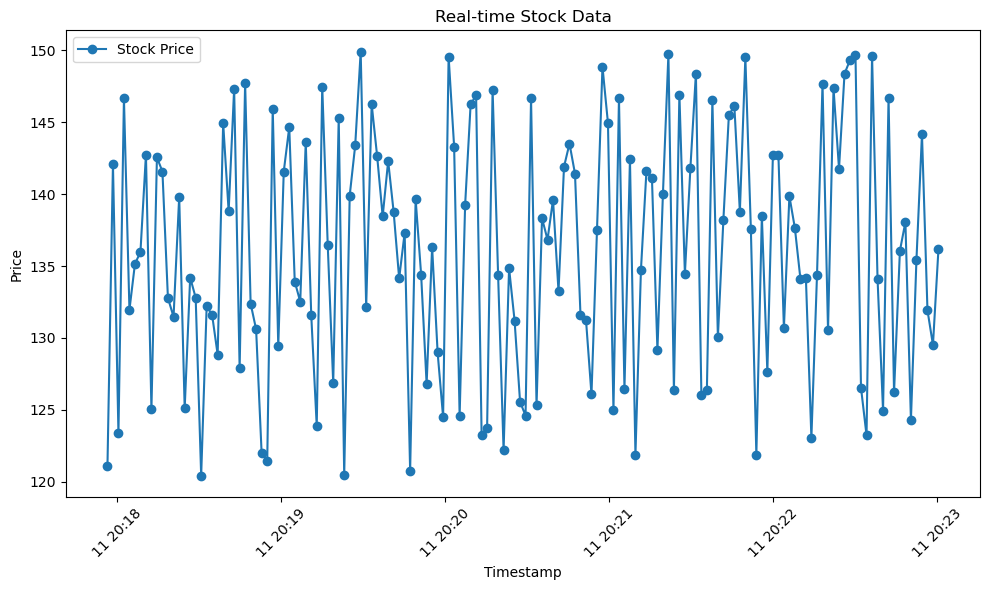

New records received:
  symbol   price                  timestamp
0   AAPL  133.62 2024-12-11 20:23:02.454559
1   AAPL  149.88 2024-12-11 20:23:04.472596


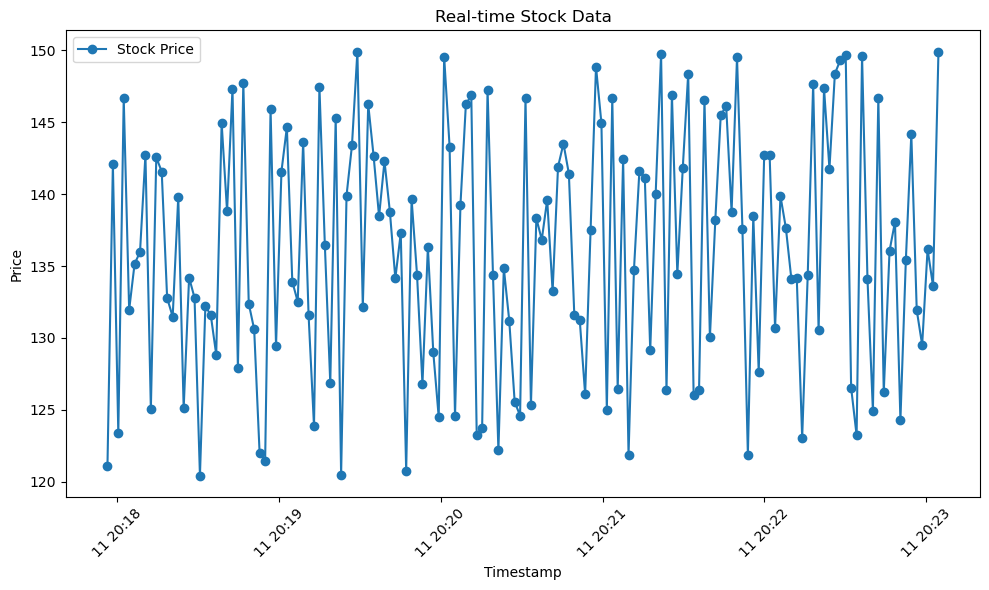

New records received:
  symbol   price                  timestamp
0   AAPL  123.51 2024-12-11 20:23:06.480939


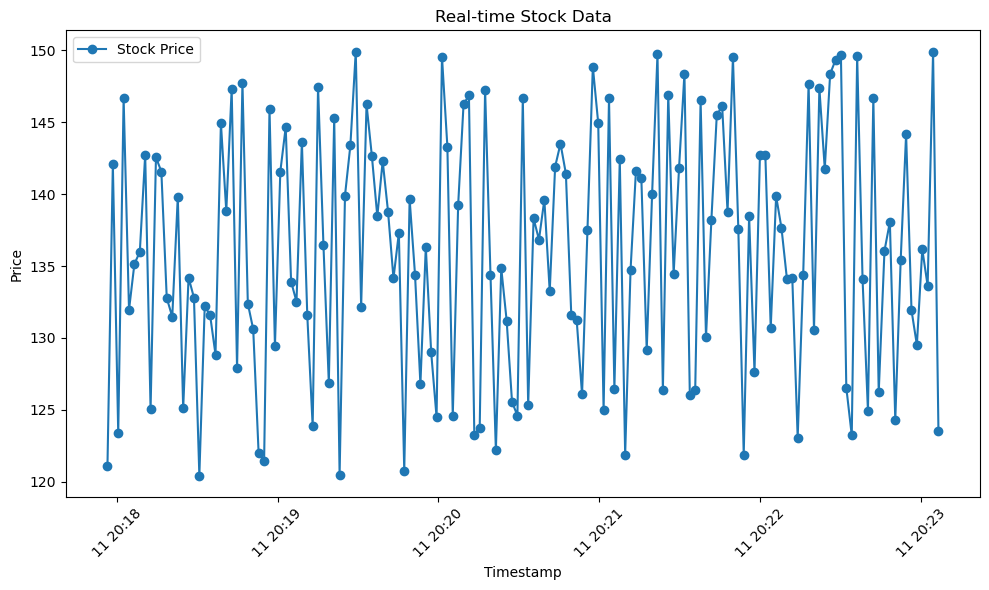

New records received:
  symbol   price                  timestamp
0   AAPL  132.09 2024-12-11 20:23:08.488845


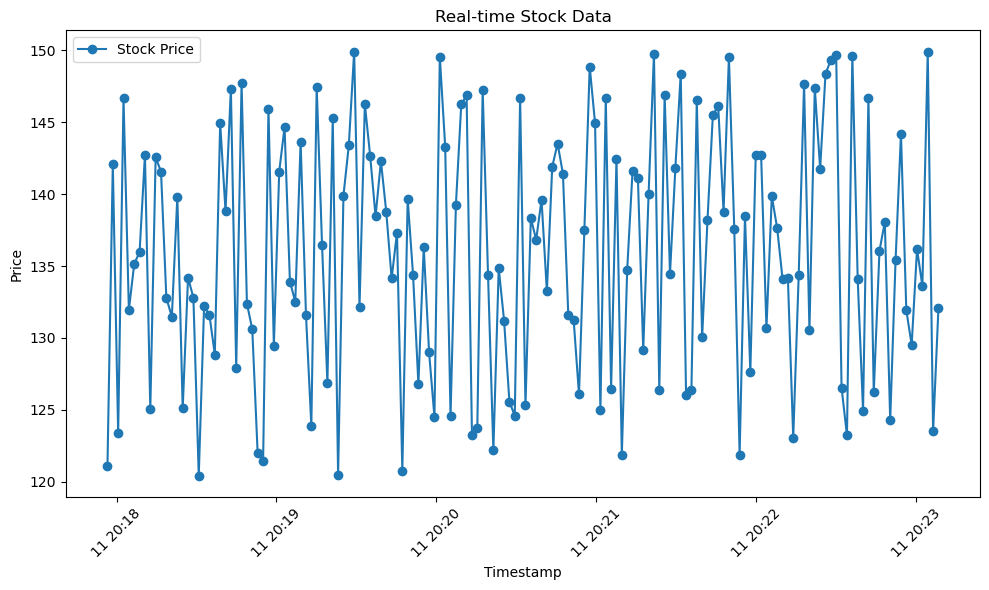

New records received:
  symbol   price                  timestamp
0   AAPL  140.98 2024-12-11 20:23:10.498004


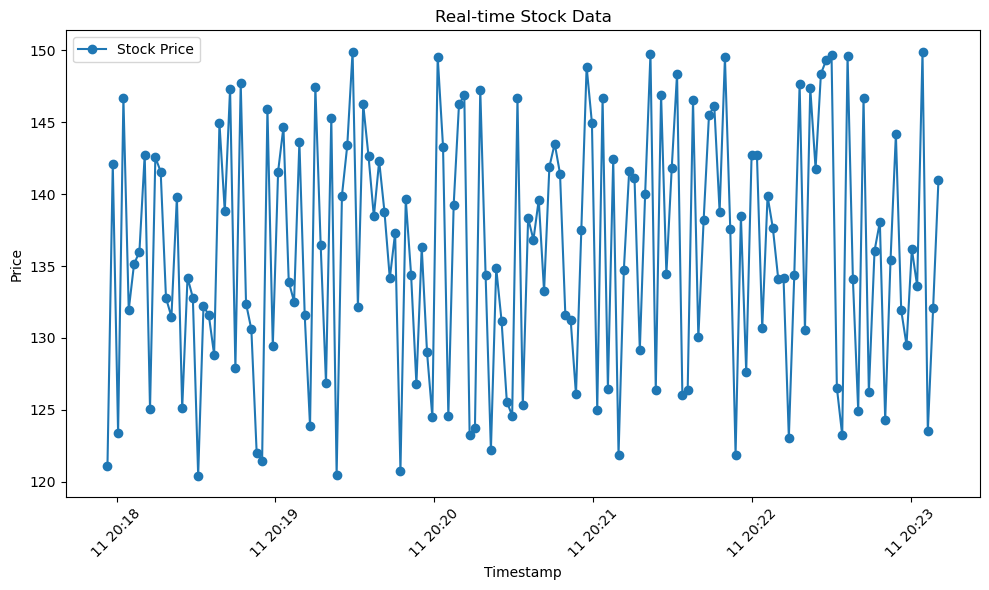

New records received:
  symbol   price                  timestamp
0   AAPL  131.95 2024-12-11 20:23:12.512503
1   AAPL  128.90 2024-12-11 20:23:14.525306


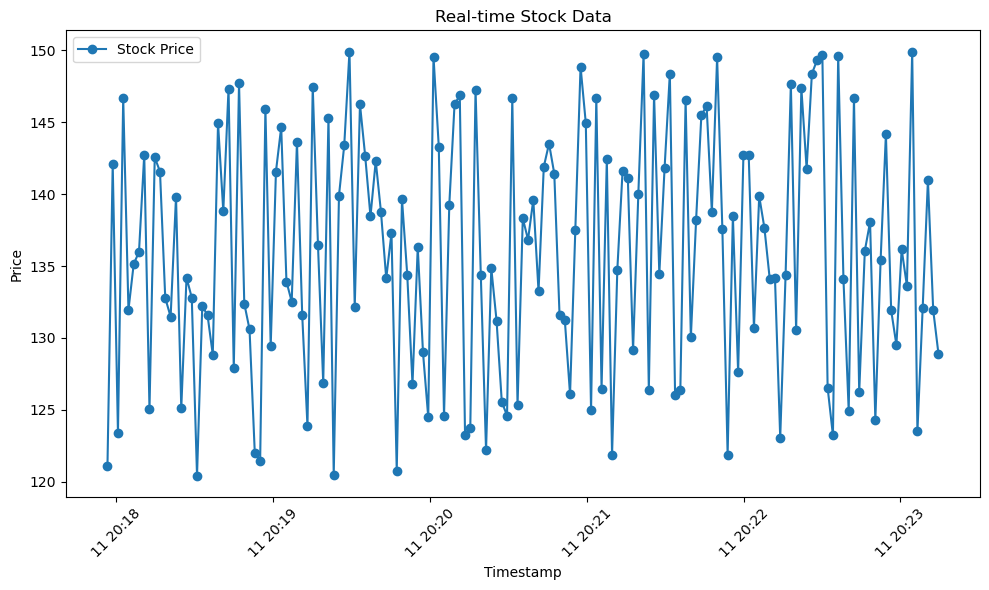

New records received:
  symbol   price                  timestamp
0   AAPL  128.87 2024-12-11 20:23:16.534008


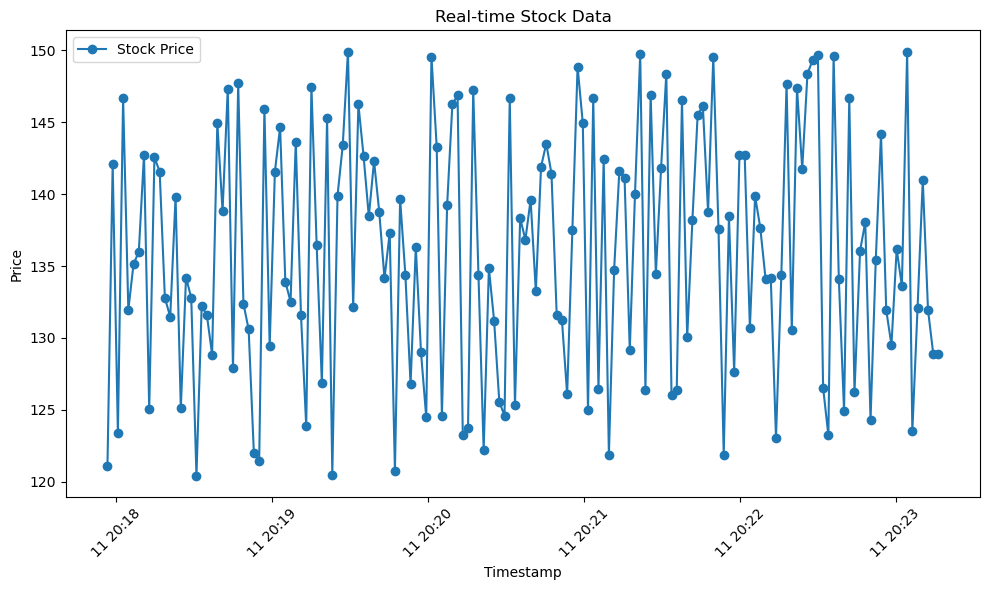

New records received:
  symbol   price                  timestamp
0   AAPL  136.89 2024-12-11 20:23:18.543164


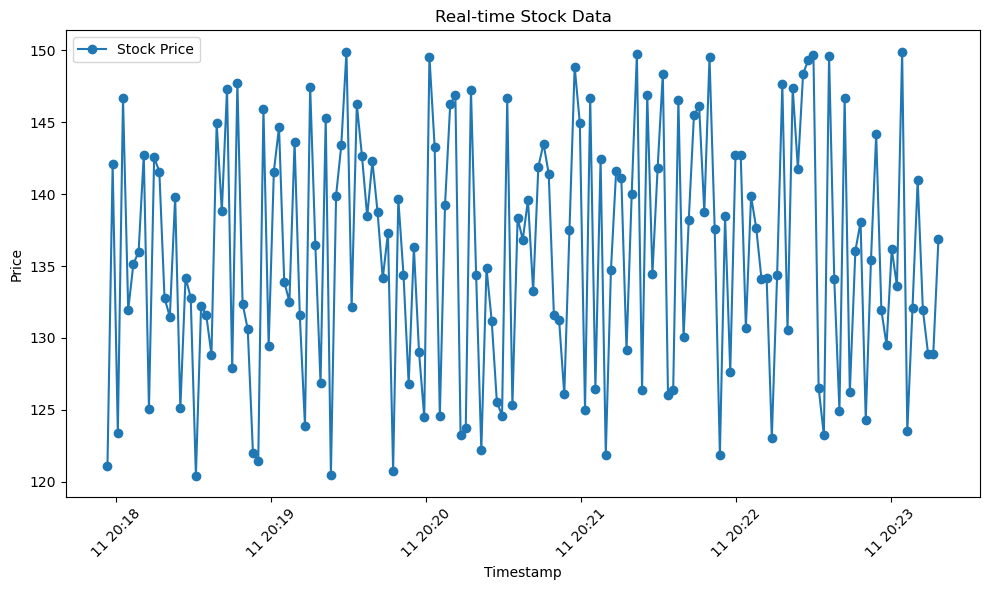

New records received:
  symbol   price                  timestamp
0   AAPL  126.45 2024-12-11 20:23:20.550760


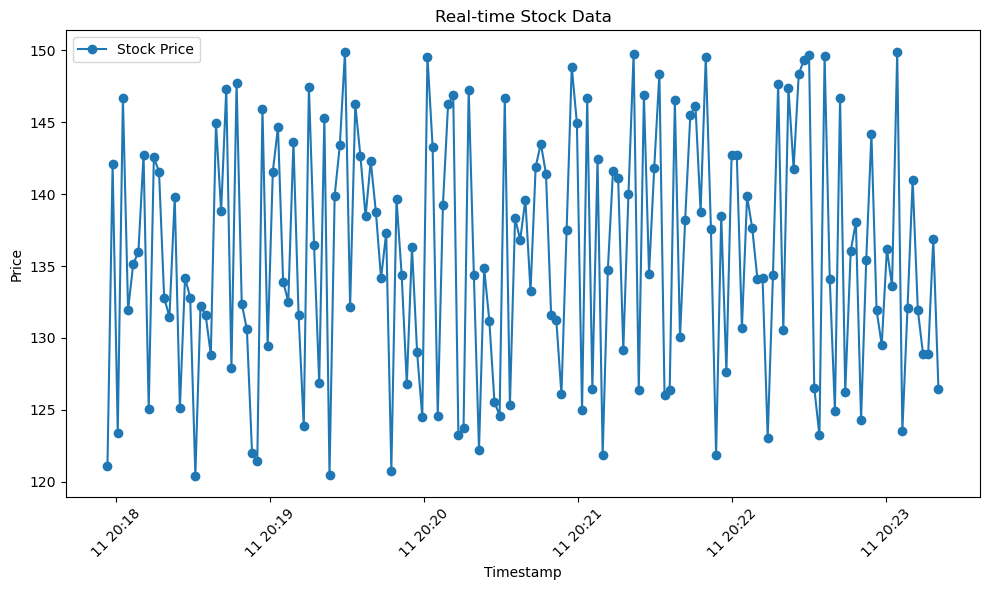

New records received:
  symbol   price                  timestamp
0   AAPL  122.63 2024-12-11 20:23:22.559150


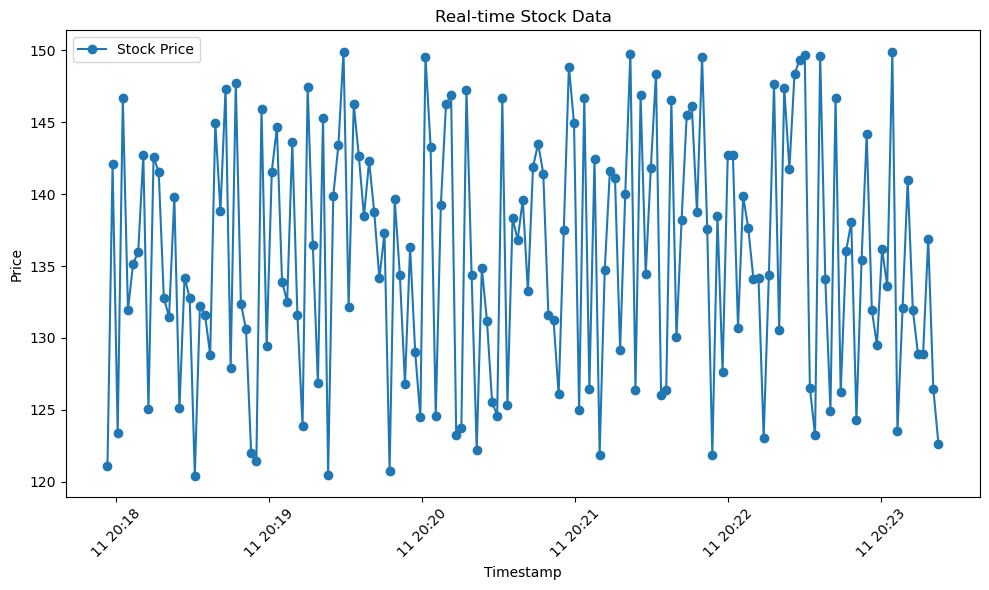

New records received:
  symbol   price                  timestamp
0   AAPL  148.84 2024-12-11 20:23:24.567766
1   AAPL  131.30 2024-12-11 20:23:26.580027


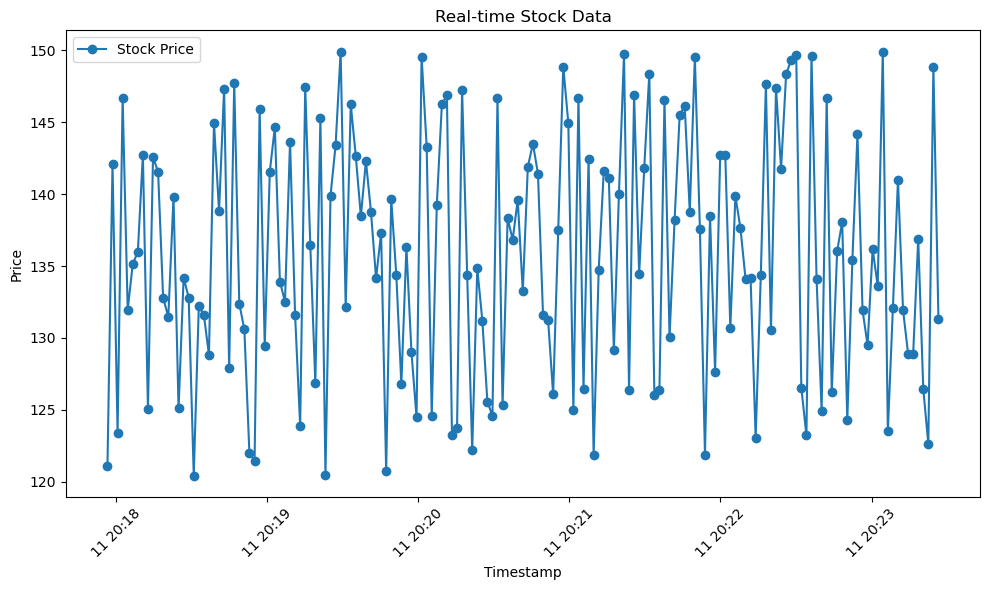

New records received:
  symbol   price                  timestamp
0   AAPL  144.75 2024-12-11 20:23:28.588897


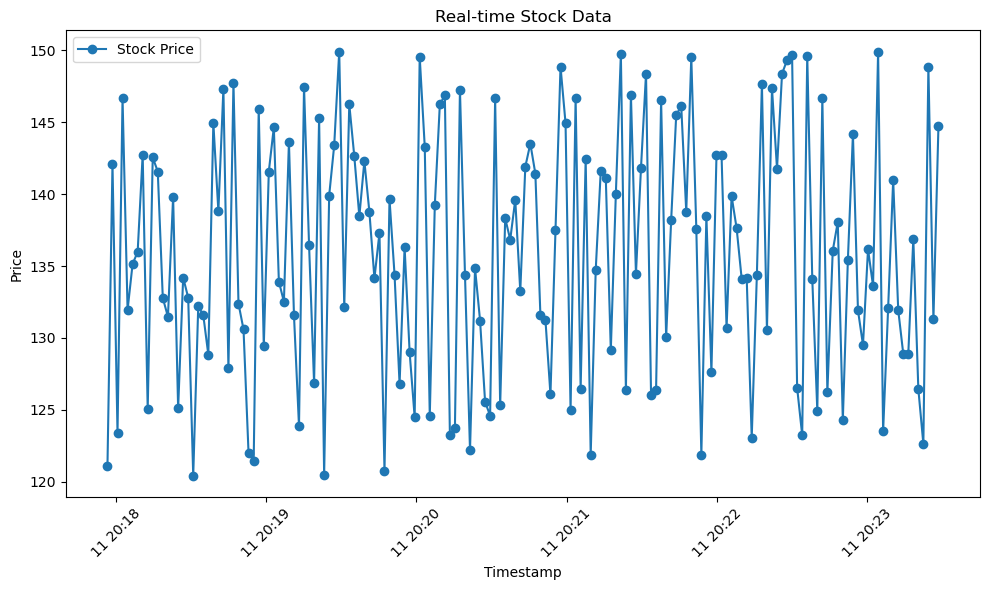

New records received:
  symbol   price                  timestamp
0   AAPL  134.26 2024-12-11 20:23:30.597680


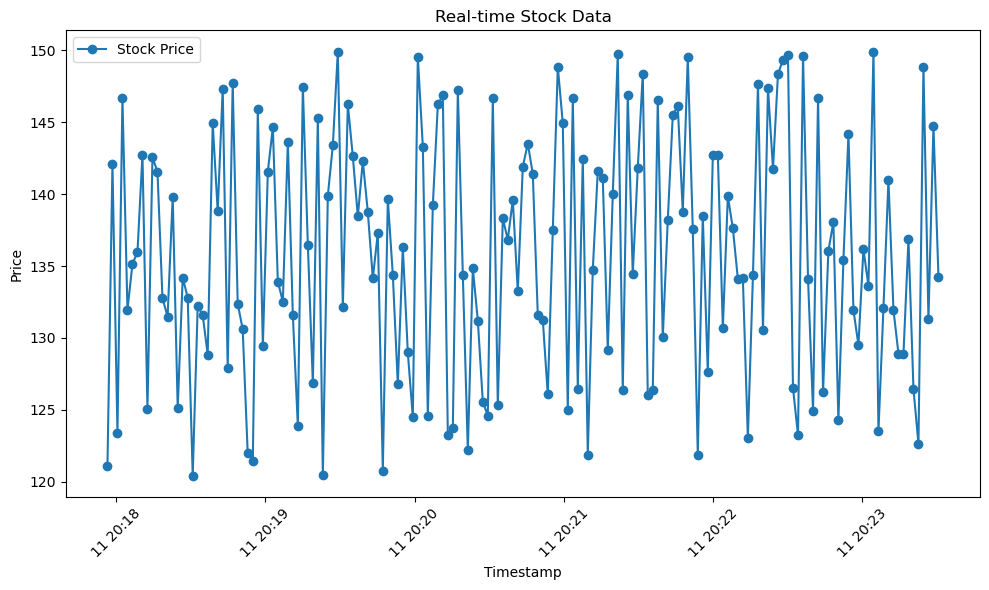

New records received:
  symbol   price                  timestamp
0   AAPL  127.96 2024-12-11 20:23:32.606738


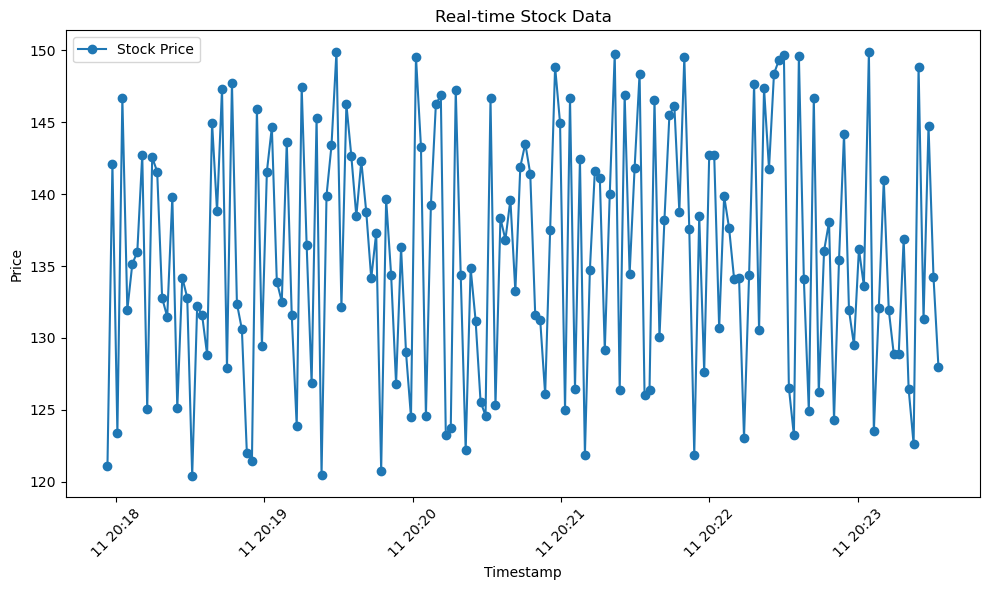

New records received:
  symbol   price                  timestamp
0   AAPL  137.63 2024-12-11 20:23:34.622339


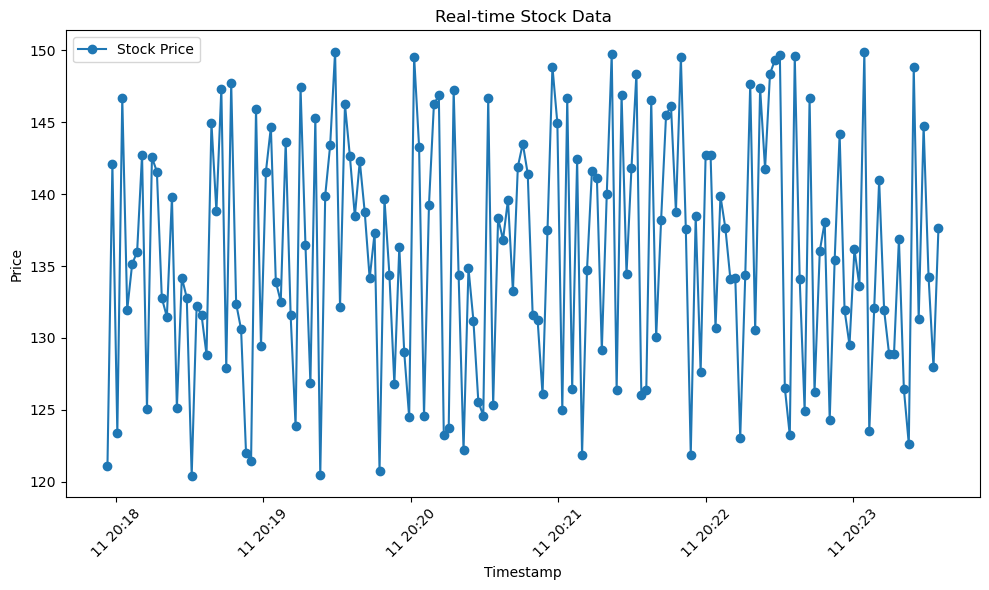

New records received:
  symbol   price                  timestamp
0   AAPL  136.70 2024-12-11 20:23:36.630134
1   AAPL  129.37 2024-12-11 20:23:38.639434


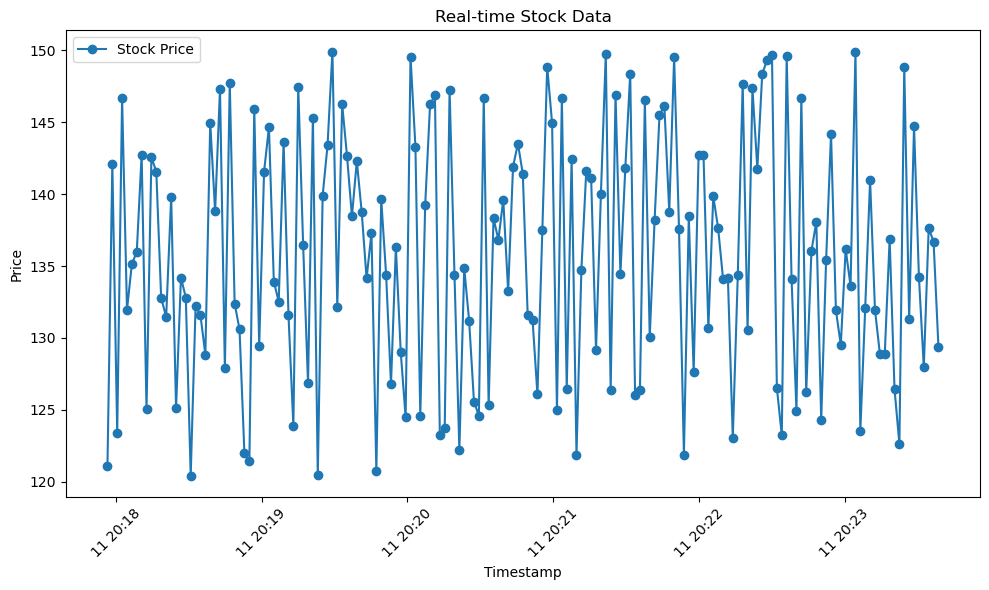

New records received:
  symbol  price                  timestamp
0   AAPL  133.7 2024-12-11 20:23:40.648463


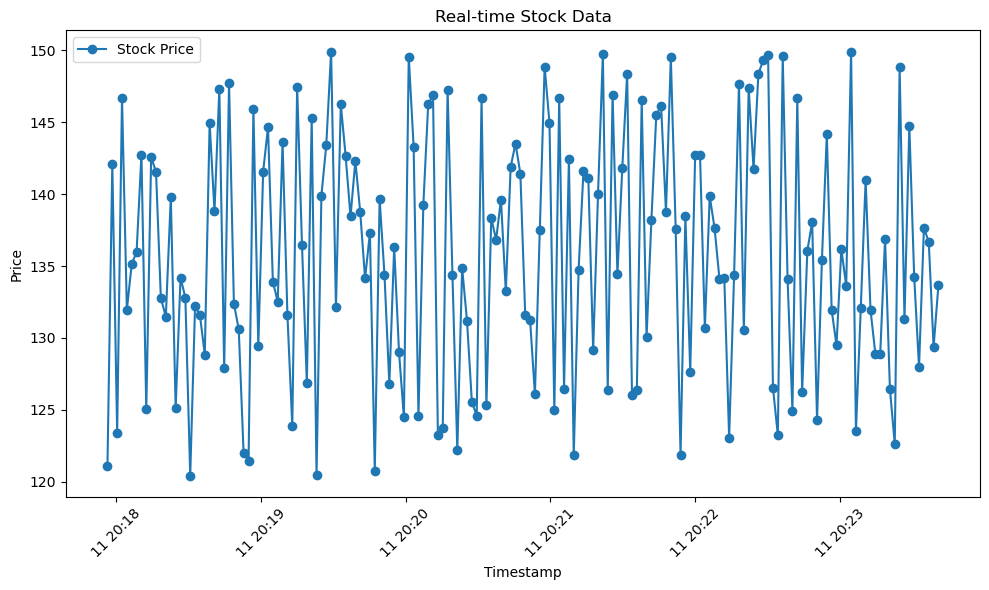

New records received:
  symbol   price                  timestamp
0   AAPL  138.94 2024-12-11 20:23:42.656598


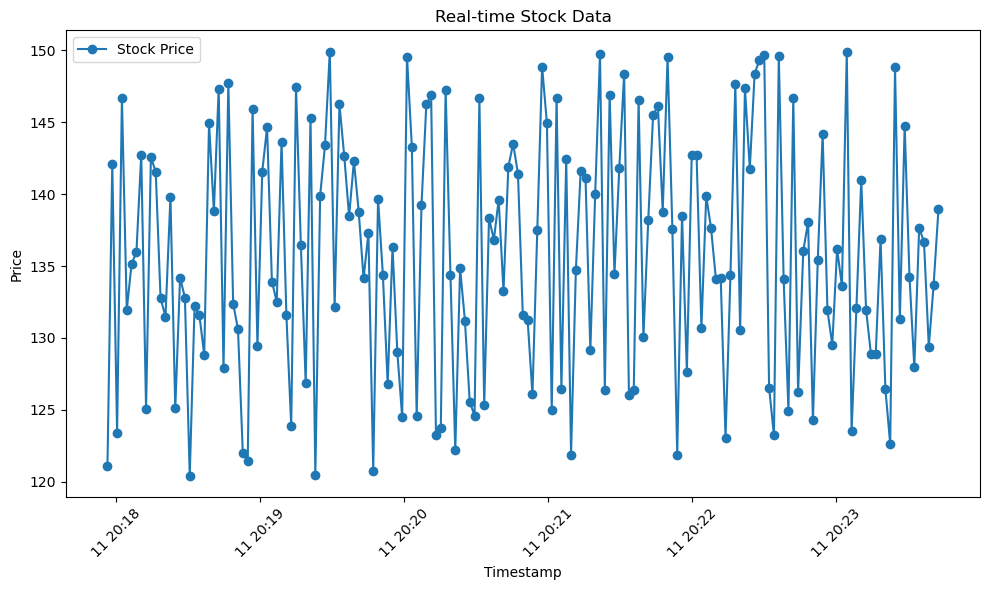

New records received:
  symbol   price                  timestamp
0   AAPL  123.79 2024-12-11 20:23:44.671289


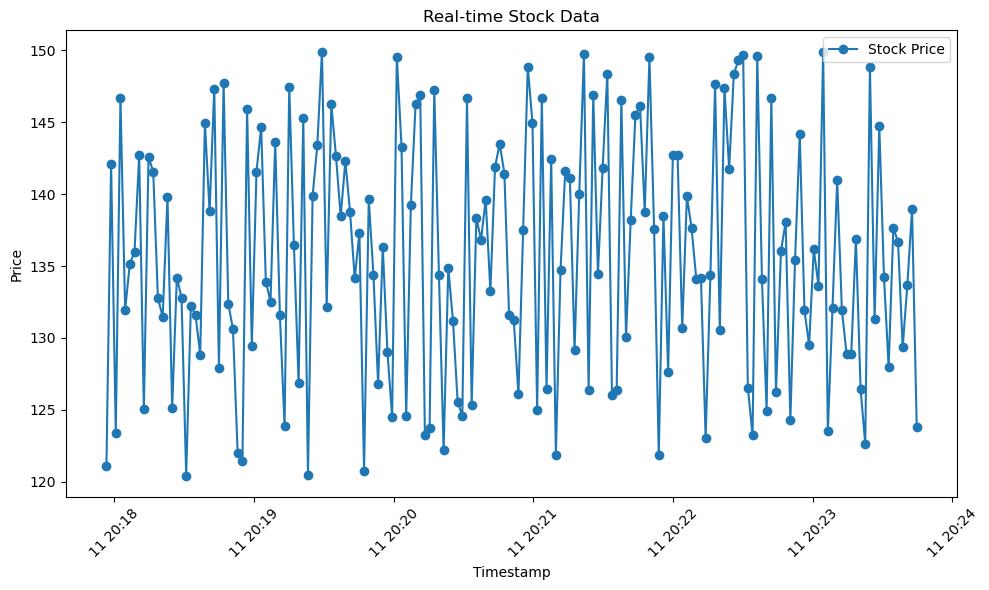

New records received:
  symbol  price                  timestamp
0   AAPL  143.8 2024-12-11 20:23:46.679848


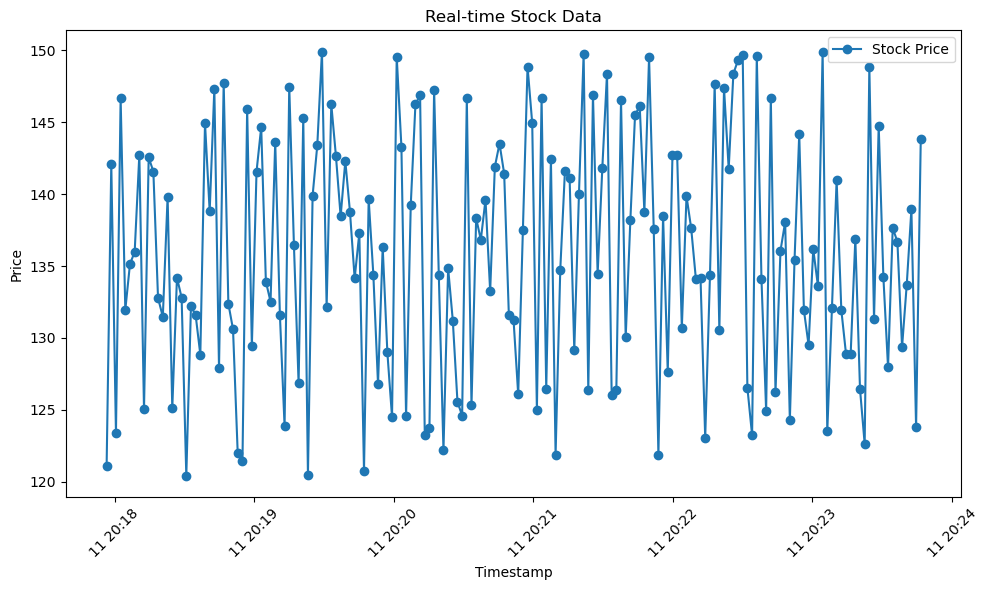

New records received:
  symbol   price                  timestamp
0   AAPL  123.73 2024-12-11 20:23:48.692709
1   AAPL  125.39 2024-12-11 20:23:50.704826


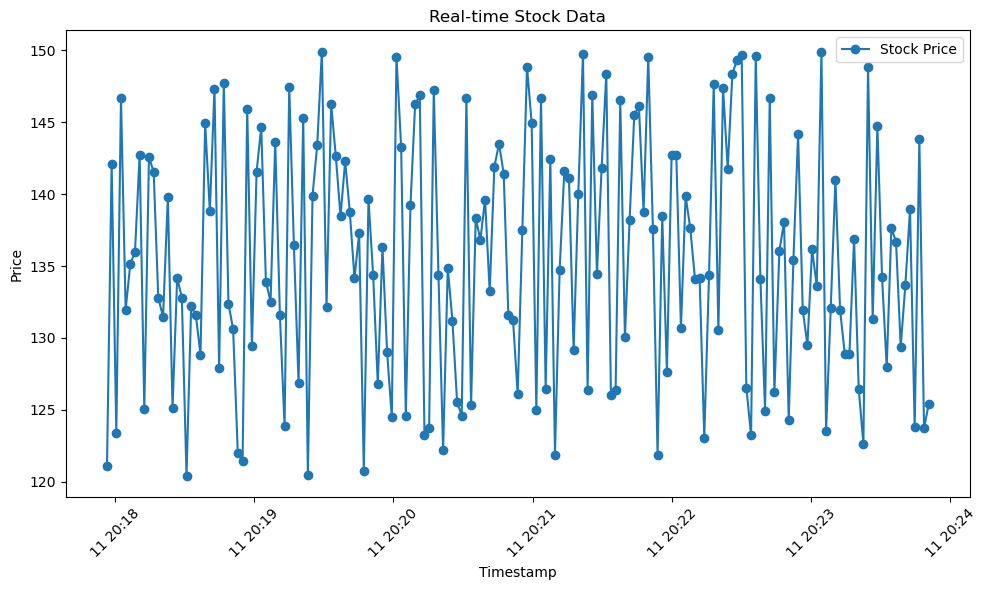

New records received:
  symbol  price                  timestamp
0   AAPL  121.3 2024-12-11 20:23:52.715152


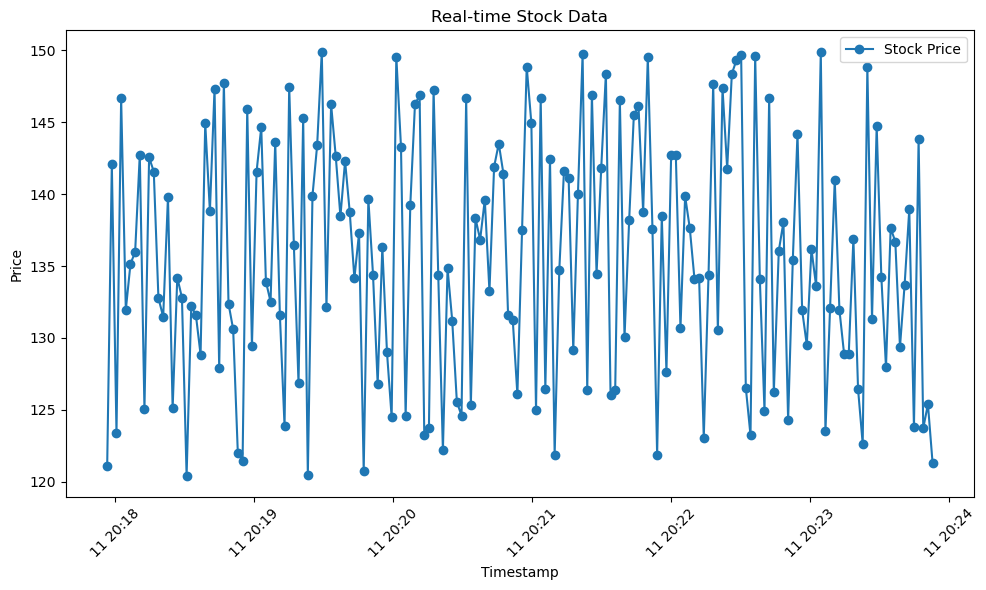

In [ ]:
# Accumulate all stock data
all_stock_data = pd.DataFrame()

print("Listening for stock data...")

while True:
    try:
        # Check for stop signal
        if os.path.exists('stop_signal.txt'):
            print("Stop signal received. Stopping consumer...")
            break

        for shard_id, shard_iterator in shard_iterators.items():
            stock_data, next_shard_iterator = read_records_from_kinesis(shard_iterator)
            shard_iterators[shard_id] = next_shard_iterator  # Update shard iterator
            
            if stock_data:
                # Convert stock data to DataFrame
                stock_df = pd.DataFrame(stock_data)
                stock_df['timestamp'] = pd.to_datetime(stock_df['timestamp'], errors='coerce')  # Parse timestamps
                
                # Append new records to the cumulative DataFrame
                all_stock_data = pd.concat([all_stock_data, stock_df], ignore_index=True)
                
                print("New records received:")
                print(stock_df)

                # Visualization of all accumulated data
                plt.figure(figsize=(10, 6))
                plt.plot(all_stock_data['timestamp'], all_stock_data['price'], marker='o', label='Stock Price')
                plt.xlabel('Timestamp')
                plt.ylabel('Price')
                plt.title('Real-time Stock Data')
                plt.legend()
                plt.xticks(rotation=45)
                plt.tight_layout()
                plt.show()
            else:
                print(f"No new records from shard {shard_id}.")
    except Exception as e:
        print(f"Error while reading records: {e}")
        break
    time.sleep(2)

print("Consumer script stopped.")